In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.linalg as tl
import torch.autograd as autograd
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from functools import reduce # reduce
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from sklearn.metrics import accuracy_score

In [2]:
# plt.rcParams["figure.figsize"] = (5, 5)

In [3]:
DEVICE = 'cuda:0' if torch.cuda.is_available() else 'cpu'
print(f"The current device is: {DEVICE}")

The current device is: cuda:0


MAIN

In [4]:
class CustomNet(nn.Module):
    def __init__(self, N, L, input_dim, output_dim, activations=None):
        """
        Initialize the network with specified width (N), depth (L),
        input/output dimensions, and activation functions.
        """
        super(CustomNet, self).__init__()
        self.layers = nn.ModuleList()

        # Set default activations to tanh
        if activations is None:
            activations = [nn.Tanh()] * (L + 1)
        elif len(activations) != L + 1:
            raise ValueError("Number of activation functions must equal L + 1 (one for each layer including output).")
        
        self.activations = activations

        # Input layer
        self.layers.append(nn.Linear(input_dim, N))

        # Hidden layers
        for _ in range(L):
            self.layers.append(nn.Linear(N, N))

        # Output layer
        self.layers.append(nn.Linear(N, output_dim))

        # Apply paper-based initialization
        self.apply(self._initialize_weights)

        # Store training and validation losses/metrics
        self.train_losses = []
        self.val_losses = []
        self.train_metrics = []
        self.val_metrics = []

    def _initialize_weights(self, module):
        """
        Custom weight initialization as per the paper.
        Weights: Gaussian distribution with variance 1/N
        Biases: Zero initialization
        """
        if isinstance(module, nn.Linear):
            fan_in = module.weight.size(1)  # Number of input features
            std = (1.0 / fan_in) ** 0.5
            nn.init.normal_(module.weight, mean=0.0, std=std)  # Gaussian with variance 1/N
            if module.bias is not None:
                nn.init.constant_(module.bias, 0.0)  # Biases initialized to zero

    def forward(self, x):
        activations = [x]
        for i, layer in enumerate(self.layers[:-1]):
            x = self.activations[i](layer(x))
            activations.append(x)
        # Add the final layer output with its activation
        x = self.activations[-1](self.layers[-1](x))
        activations.append(x)
        return activations
    
    def __repr__(self):
        # Custom string representation to include layers and activations
        repr_str = f"{self.__class__.__name__}(\n"
        for i, (layer, activation) in enumerate(zip(self.layers, self.activations)):
            repr_str += f"  ({i}): {layer} -> {activation}\n"
        repr_str += ")"
        return repr_str

    def compute_jacobian_sequence(self, x, return_total_jacobians=True):
        """
        Compute the Jacobian for each layer's output with respect to the input or the previous layer.
        
        Parameters:
        - x (torch.Tensor): Input tensor
        - return_total_jacobians (bool): If True, compute Jacobians from input to each layer;
                                          if False, compute Jacobians from each layer to the next layer.
        """
        x = x.requires_grad_(True)  # Ensure input requires gradients
        jacobians = []
        activations = self.forward(x)  # Perform forward pass to get all layer activations

        if return_total_jacobians:
            # Compute Jacobian of each layer's output with respect to the original input
            for activation in activations[1:]:
                activation = activation.requires_grad_(True)
                jacobian = []
                for j in range(activation.size(1)):
                    grad_outputs = torch.zeros_like(activation)
                    grad_outputs[:, j] = 1
                    gradients = torch.autograd.grad(outputs=activation, inputs=x, grad_outputs=grad_outputs,
                                                    create_graph=True, retain_graph=True, only_inputs=True)[0]
                    jacobian.append(gradients)
                jacobian = torch.stack(jacobian, dim=1)
                jacobians.append(jacobian)
        else:
            # Compute Jacobian from each layer to the next layer
            for i, layer in enumerate(self.layers):
                input_to_layer = activations[i].requires_grad_(True)
                output_of_layer = layer(input_to_layer) if layer is self.layers[-1] else self.activations[i](layer(input_to_layer))

                jacobian = []
                for j in range(output_of_layer.size(1)):
                    grad_outputs = torch.zeros_like(output_of_layer)
                    grad_outputs[:, j] = 1
                    gradients = torch.autograd.grad(outputs=output_of_layer, inputs=input_to_layer, grad_outputs=grad_outputs,
                                                    create_graph=True, retain_graph=True, only_inputs=True)[0]
                    jacobian.append(gradients)
                jacobian = torch.stack(jacobian, dim=1)
                jacobians.append(jacobian)

        return jacobians
    
    def compute_last_jacobian(self, x):
        """
        Compute the Jacobian of the network's output with respect to its input (last Jacobian).
        
        Parameters:
        - x (torch.Tensor): Input tensor of shape (batch_size, input_dim)
        
        Returns:
        - torch.Tensor: The last Jacobian of shape (batch_size, output_dim, input_dim)
        """
        x = x.requires_grad_(True)  # Ensure input requires gradients
        output = self.forward(x)[-1]  # Get the network output
        batch_size, output_dim = output.shape
        input_dim = x.shape[1]
        
        jacobian = torch.zeros(batch_size, output_dim, input_dim, device=x.device)  # Initialize Jacobian tensor
        
        # Compute the gradient for each output dimension
        for i in range(output_dim):
            grad_outputs = torch.zeros_like(output)
            grad_outputs[:, i] = 1  # Set the gradient for the i-th output
            gradients = torch.autograd.grad(
                outputs=output, inputs=x, grad_outputs=grad_outputs,
                create_graph=False, retain_graph=True, only_inputs=True
            )[0]
            jacobian[:, i, :] = gradients
        
        return jacobian


    def fit(self, x_train, y_train, x_val, y_val, optimizer_cls=optim.Adam, optimizer_params={}, loss_fn=nn.MSELoss, 
            lr=0.001, num_epochs=50, batch_size=None, metric_fn=None, print_every=1, freeze=False, 
            early_stopping=False, window_size=5, patience=10):
        """
        Train the network with early stopping based on moving averages of validation loss.
        
        Parameters:
        - x_train (torch.Tensor): Training inputs
        - y_train (torch.Tensor): Training targets
        - x_val (torch.Tensor): Validation inputs
        - y_val (torch.Tensor): Validation targets
        - optimizer_cls: Optimizer class (e.g., optim.Adam, optim.SGD)
        - loss_fn: Loss function class (e.g., nn.MSELoss, nn.CrossEntropyLoss)
        - lr (float): Learning rate
        - num_epochs (int): Number of training epochs
        - batch_size (int or None): Batch size for training (use full dataset if None)
        - metric_fn: A function to compute a custom metric (e.g., accuracy). If None, metrics are ignored.
        - print_every (int): Print loss and metric every `print_every` epochs
        - freeze (bool): If True, freeze all layers except the last hidden and output layers.
        - early_stopping (bool): Whether to apply early stopping.
        - window_size (int): Window size for moving average of validation loss.
        - patience (int): Number of epochs to wait for improvement before stopping.
        """
        # Freeze parameters if requested
        if freeze:
            for i, layer in enumerate(self.layers[:-2]):  # Freeze all but the last two layers
                for param in layer.parameters():
                    param.requires_grad = False

        # Create optimizer with only trainable parameters
        optimizer = optimizer_cls(filter(lambda p: p.requires_grad, self.parameters()), lr=lr, **optimizer_params)
        loss_function = loss_fn()

        best_val_loss = float('inf')
        wait = 0  # Counter for patience
        val_loss_history = []  # Store validation losses for moving average

        for epoch in range(num_epochs):
            self.train()
            train_loss = 0.0
            train_metric = 0.0 if metric_fn else None

            # Training Loop
            if batch_size is None:
                # Train on the entire dataset
                predictions = self.forward(x_train)[-1]
                loss = loss_function(predictions, y_train)
                train_loss = loss.item()

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                # Compute metric if provided
                if metric_fn:
                    train_metric = metric_fn(predictions, y_train)
            else:
                # Train using batches
                train_dataset = TensorDataset(x_train, y_train)
                train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
                
                for x_batch, y_batch in train_loader:
                    predictions = self.forward(x_batch)[-1]
                    loss = loss_function(predictions, y_batch)
                    train_loss += loss.item()

                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()

                    # Compute metric if provided
                    if metric_fn:
                        train_metric += metric_fn(predictions, y_batch)

                train_loss /= len(train_loader)
                if metric_fn:
                    train_metric /= len(train_loader)

            # Validation Loop
            self.eval()
            val_loss = 0.0
            val_metric = 0.0 if metric_fn else None

            if batch_size is None:
                # Evaluate on the entire validation dataset
                with torch.no_grad():
                    predictions = self.forward(x_val)[-1]
                    val_loss = loss_function(predictions, y_val).item()
                    if metric_fn:
                        val_metric = metric_fn(predictions, y_val)
            else:
                # Evaluate using batches
                val_dataset = TensorDataset(x_val, y_val)
                val_loader = DataLoader(val_dataset, batch_size=batch_size)
                
                with torch.no_grad():
                    for x_batch, y_batch in val_loader:
                        predictions = self.forward(x_batch)[-1]
                        loss = loss_function(predictions, y_batch)
                        val_loss += loss.item()

                        # Compute metric if provided
                        if metric_fn:
                            val_metric += metric_fn(predictions, y_batch)

                    val_loss /= len(val_loader)
                    if metric_fn:
                        val_metric /= len(val_loader)

            # Store losses and metrics
            self.train_losses.append(train_loss)
            self.val_losses.append(val_loss)
            if metric_fn:
                self.train_metrics.append(train_metric)
                self.val_metrics.append(val_metric)

            # Update moving average history
            val_loss_history.append(val_loss)
            if window_size and len(val_loss_history) > window_size:
                val_loss_history.pop(0)

            # Compute moving averages and check for early stopping
            if early_stopping and len(val_loss_history) == window_size:
                current_moving_avg = sum(val_loss_history) / window_size
                if current_moving_avg < best_val_loss:
                    best_val_loss = current_moving_avg
                    wait = 0  # Reset patience counter
                else:
                    wait += 1
                    if wait >= patience:
                        print(f"Early stopping at epoch {epoch + 1}")
                        break

            # Print every kth epoch
            if (epoch + 1) % print_every == 0 or epoch == 0:
                if metric_fn:
                    print(f"Epoch [{epoch+1}/{num_epochs}] | "
                        f"Train Loss: {train_loss:.4f}, Train Metric: {train_metric:.4f}, "
                        f"Val Loss: {val_loss:.4f}, Val Metric: {val_metric:.4f}")
                else:
                    print(f"Epoch [{epoch+1}/{num_epochs}] | "
                        f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

        # Unfreeze all layers after training if they were frozen
        if freeze:
            for i, layer in enumerate(self.layers[:-2]):  # Unfreeze all but the last two layers
                for param in layer.parameters():
                    param.requires_grad = True

        print("Training complete.")



    def predict(self, x):
        """
        Predict outputs given a set of inputs.
        
        Parameters:
        - x (torch.Tensor): Input tensor
        
        Returns:
        - torch.Tensor: Predictions
        """
        self.eval()
        with torch.no_grad():
            predictions = self.forward(x)[-1]
        return predictions


In [5]:
torch.manual_seed(42)
X = (torch.rand(4000, 2) * 4 - 2).to(DEVICE)
y = (torch.where(X[:, 0]**2 + X[:, 1]**2 < 1, 1., -1.)).reshape(-1, 1).to(DEVICE)

In [6]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

In [7]:
def accuracy_fn(preds, targets):
    targets_max, targets_min = targets.max(), targets.min()
    threshold = (targets_max + targets_min) / 2
    preds = torch.where(preds >= threshold, targets_max, targets_min)
    return (preds == targets).float().mean()

In [8]:
N = 2
L = 12
input_dim = 2
output_dim = 1


torch.manual_seed(42)

net = CustomNet(N, L, input_dim, output_dim).to(DEVICE)

net.fit(X_train, y_train, X_val, y_val,
        optimizer_cls=optim.Adam, optimizer_params={}, loss_fn=nn.MSELoss, 
        lr=0.01, num_epochs=2500, metric_fn=accuracy_fn, batch_size=None,
        print_every=500, freeze=False)#, early_stopping=True, window_size=1000)

Epoch [1/2500] | Train Loss: 1.0000, Train Metric: 0.5044, Val Loss: 0.9576, Val Metric: 0.7900
Epoch [500/2500] | Train Loss: 0.3238, Train Metric: 0.8697, Val Loss: 0.3104, Val Metric: 0.8800
Epoch [1000/2500] | Train Loss: 0.2437, Train Metric: 0.9164, Val Loss: 0.2037, Val Metric: 0.9350
Epoch [1500/2500] | Train Loss: 0.2374, Train Metric: 0.9217, Val Loss: 0.1950, Val Metric: 0.9300
Epoch [2000/2500] | Train Loss: 0.2200, Train Metric: 0.9283, Val Loss: 0.1539, Val Metric: 0.9600
Epoch [2500/2500] | Train Loss: 0.2162, Train Metric: 0.9292, Val Loss: 0.1528, Val Metric: 0.9600
Training complete.


In [10]:
x_range=[-2, 2]
y_range=[-2, 2]
grid_step=0.05
"""
Plot separate figures of points showing their transformation layer by layer in the network.

Parameters:
- net: The trained network.
- x_range: Tuple (min_x, max_x) for the input space.
- y_range: Tuple (min_y, max_y) for the input space.
- grid_step: Step size for sampling points in the input space.
- save_dir: Directory to save the figures (if provided).
"""
# Determine the device from the network

# Step 1: Create a grid of points on the appropriate device
x_values = torch.arange(x_range[0], x_range[1] + grid_step, grid_step, device=DEVICE)
y_values = torch.arange(y_range[0], y_range[1] + grid_step, grid_step, device=DEVICE)
x_grid, y_grid = torch.meshgrid(x_values, y_values, indexing="ij")
grid_points = torch.stack([x_grid.flatten(), y_grid.flatten()], dim=1)  # Shape: (num_points, 2)

In [11]:
grid_labels = torch.where(grid_points[:,0]**2 + grid_points[:,1]**2 < 1, 1., -1.)
colors = np.where(grid_labels.cpu() == 1, 'red', 'blue')

In [12]:
jacobian_sequence = net.compute_jacobian_sequence(grid_points, return_total_jacobians=False)

# # Step 3: Iteratively transform the points layer by layer
transformed_points = grid_points.clone()  # Start with the original input points

In [33]:
def compute_layer_to_layer_transforms(net, grid_points):
    """
    Computes the layer-to-layer transformations of grid points through the network.
    
    Parameters:
    - net: Trained CustomNet instance.
    - grid_points: Tensor of shape (num_points, input_dim), the points to be transformed layer by layer.
    
    Returns:
    - layer_transforms: List of tensors, where each tensor represents the points transformed 
      at each layer (including input and output layers).
    """
    grid_points = grid_points.to(DEVICE)   # Ensure points are on the same device

    # Store transformed points layer by layer
    layer_transforms = [grid_points]  # Include original points as layer 0

    # Forward pass layer-by-layer
    current_points = grid_points  # Initialize with input points
    for i, (layer, activation) in enumerate(zip(net.layers, net.activations)):
        # Apply one layer of transformation
        current_points = activation(layer(current_points))
        layer_transforms.append(current_points.detach())  # Detach to save memory and avoid gradients

    return layer_transforms

In [34]:
transformed_sequences = compute_layer_to_layer_transforms(net, grid_points)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


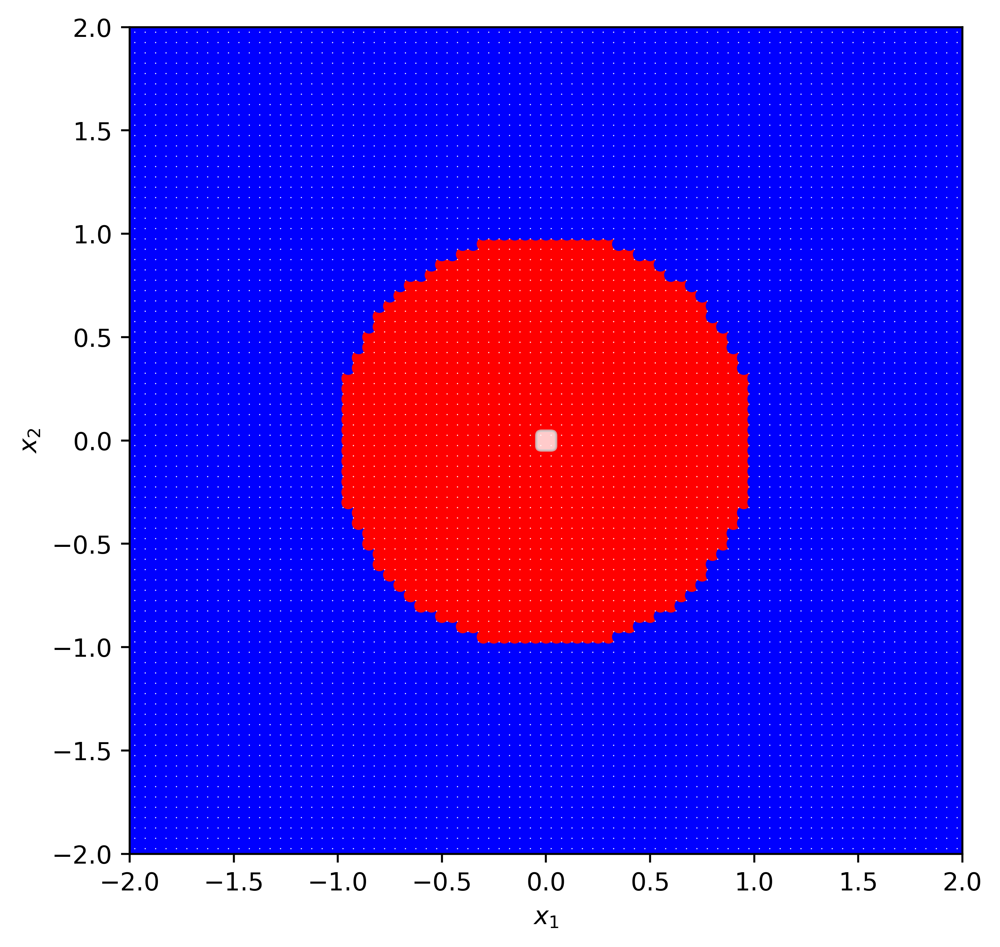

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

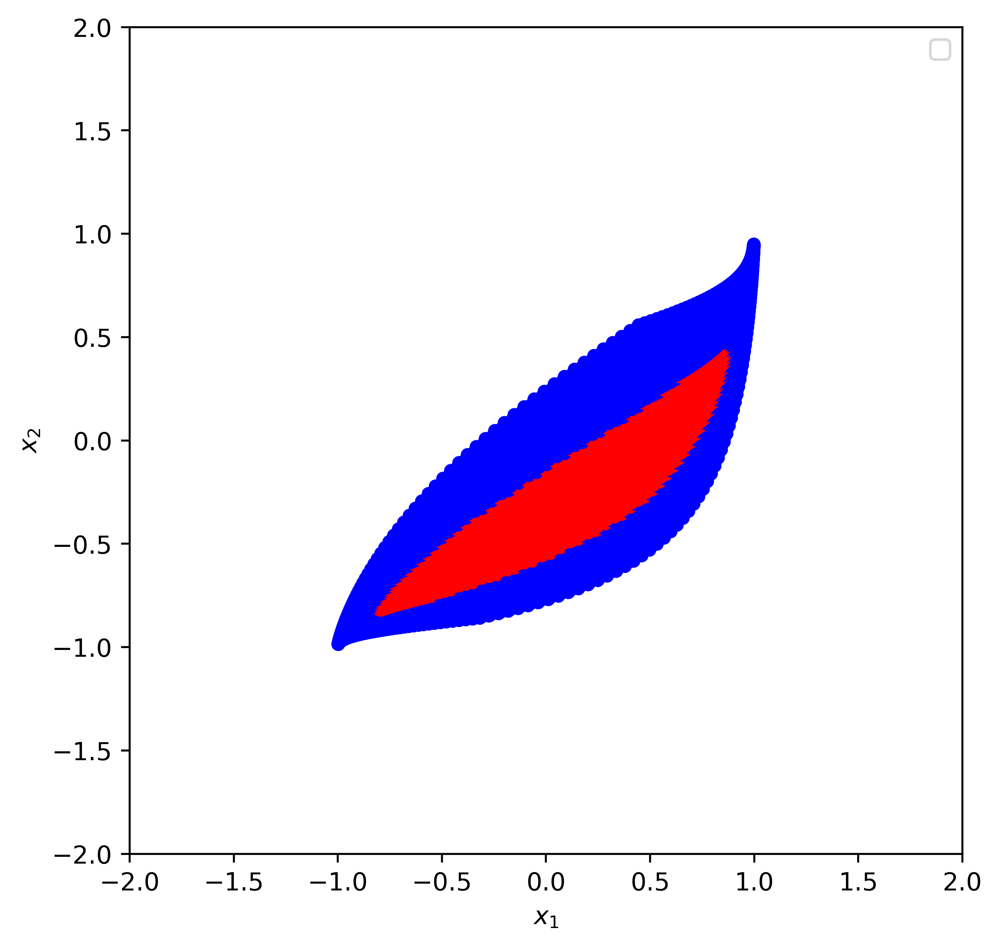

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

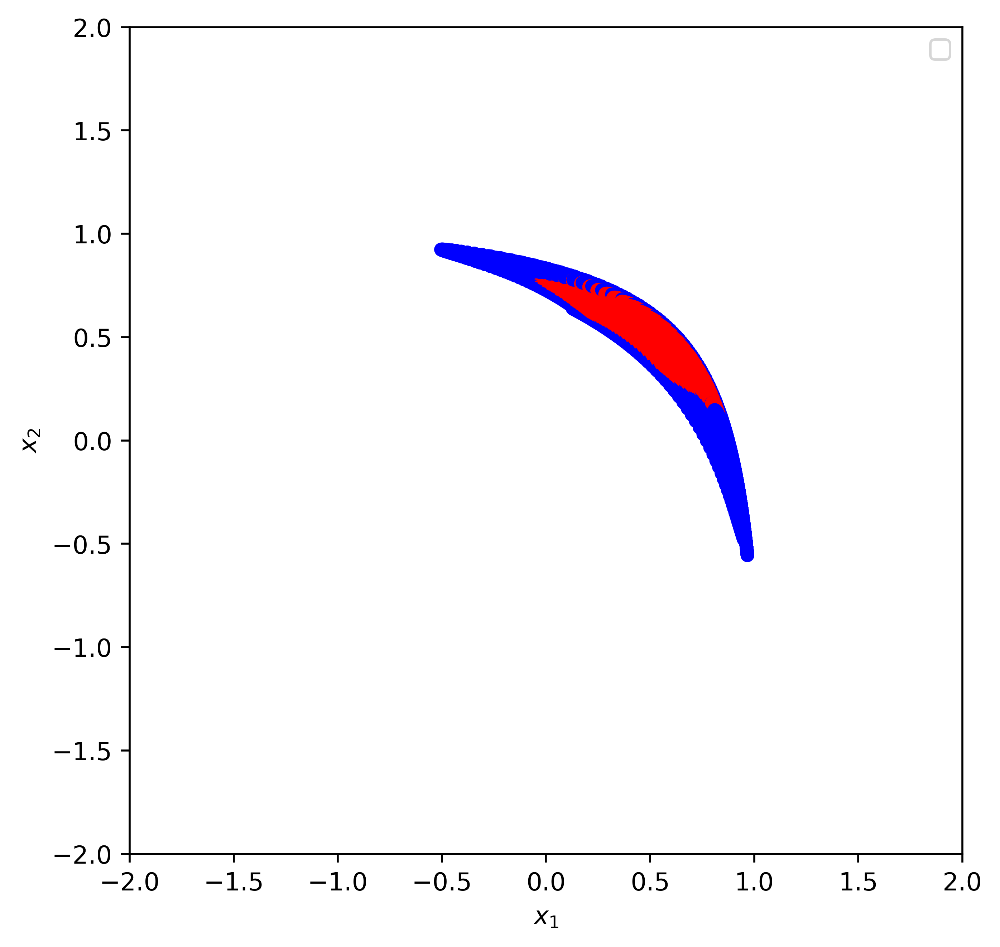

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

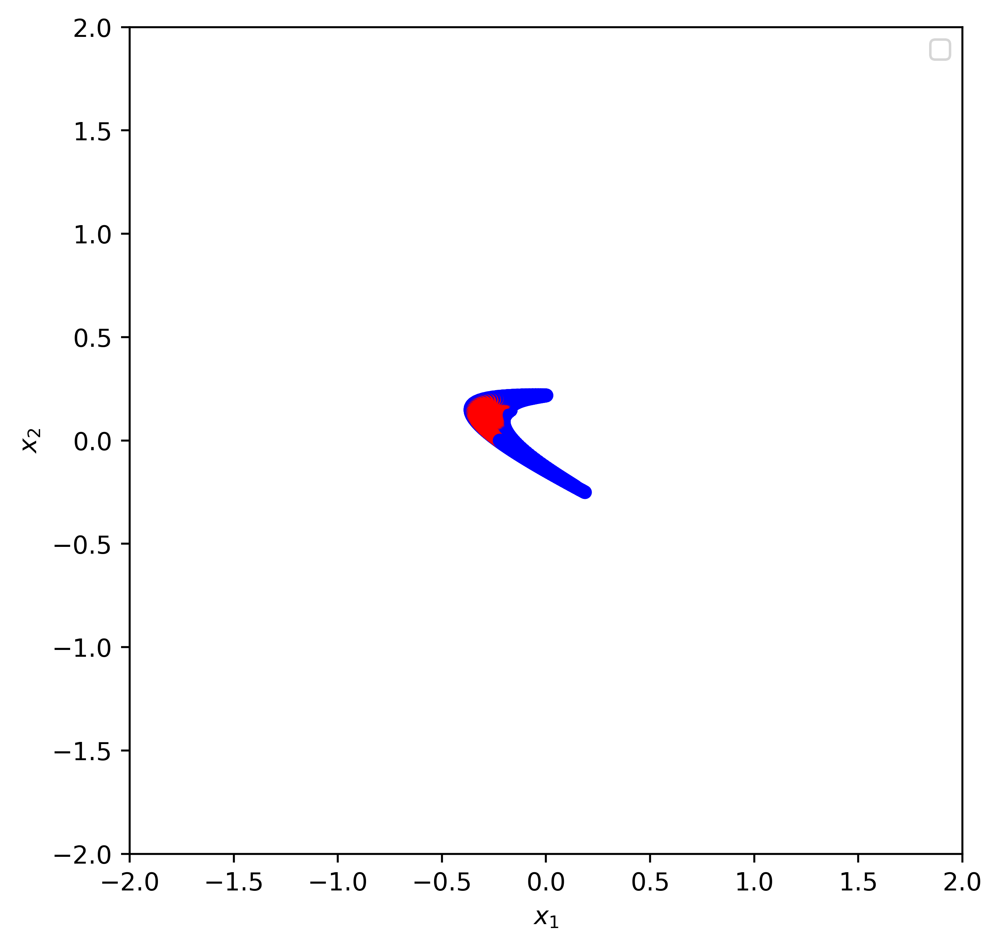

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

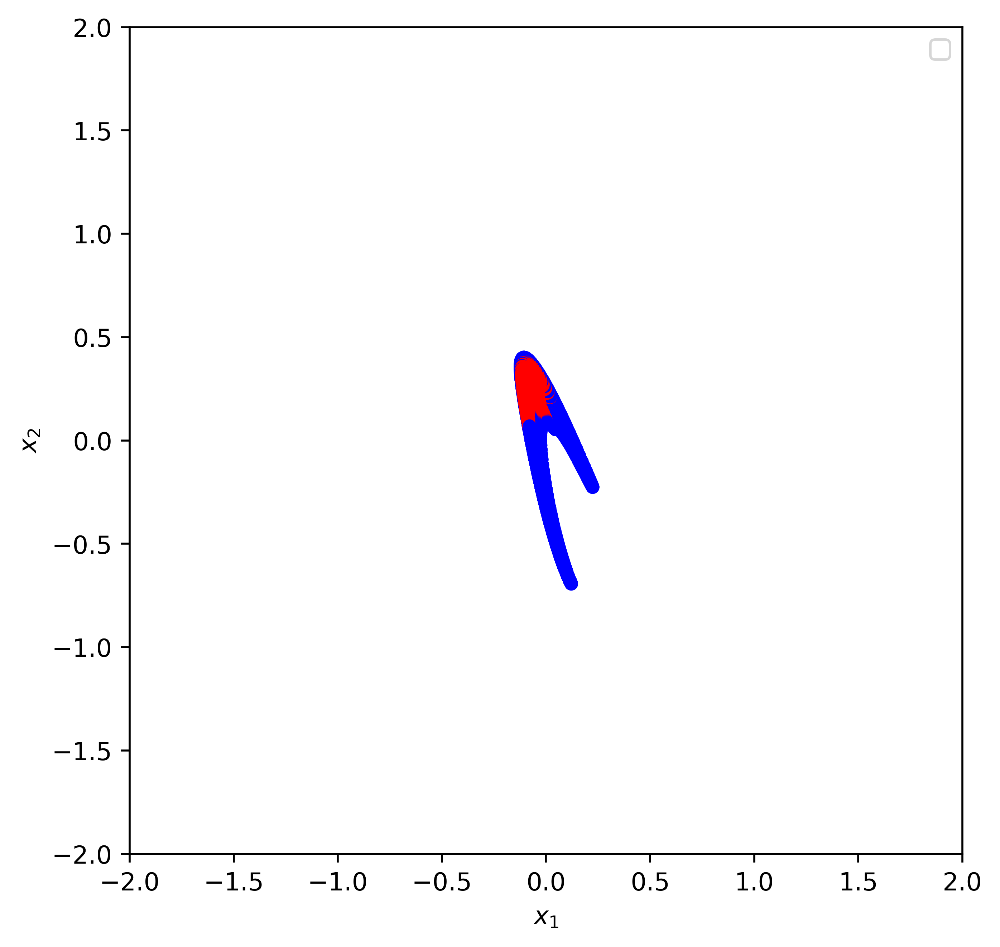

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

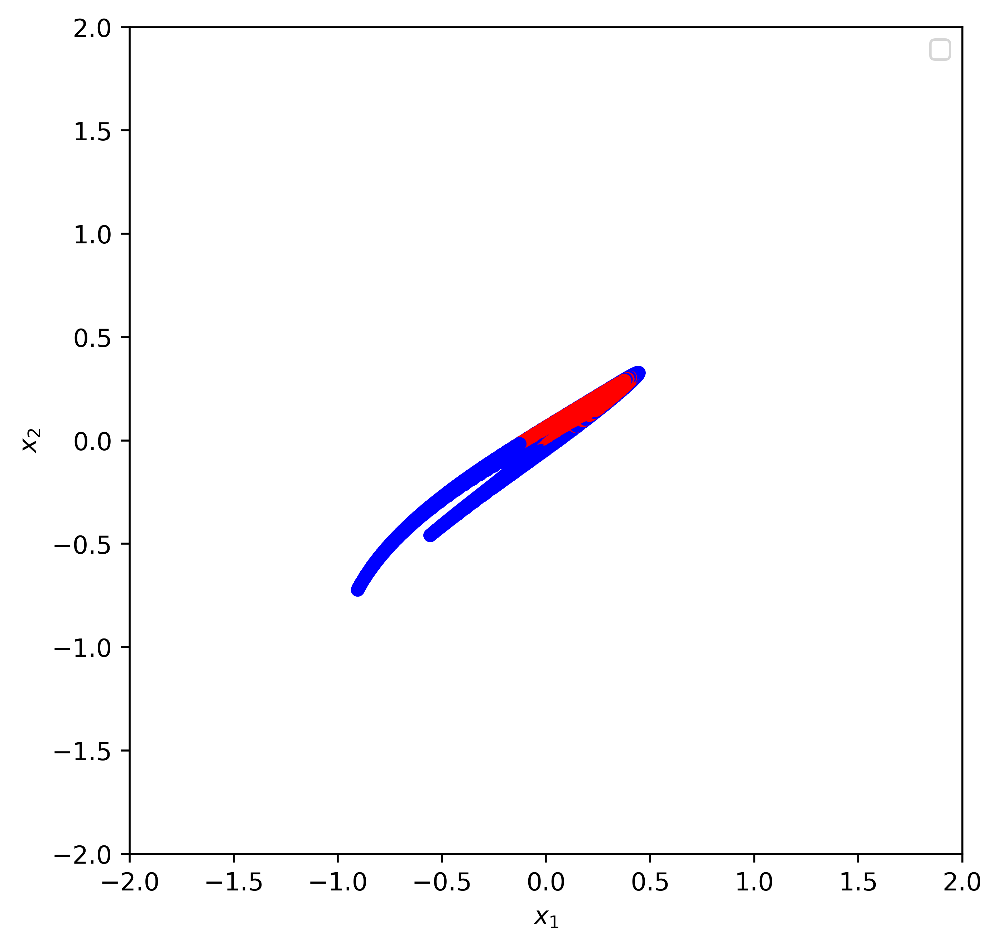

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

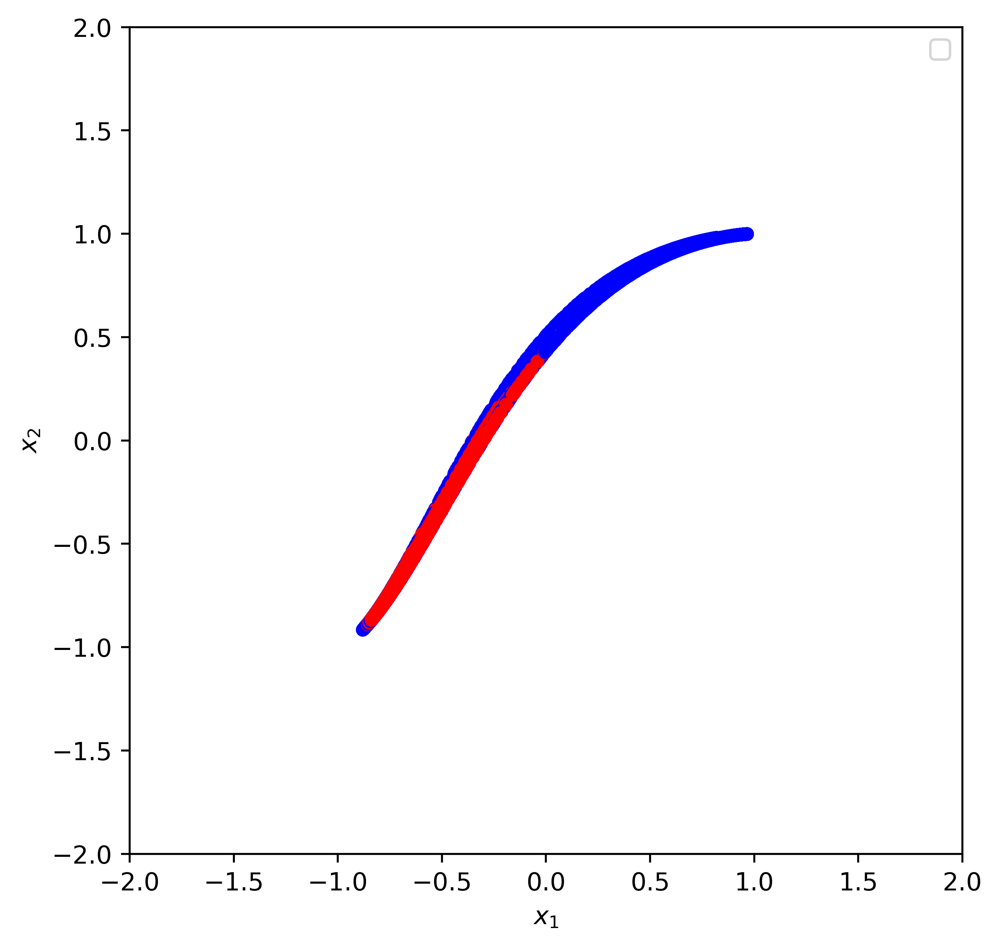

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

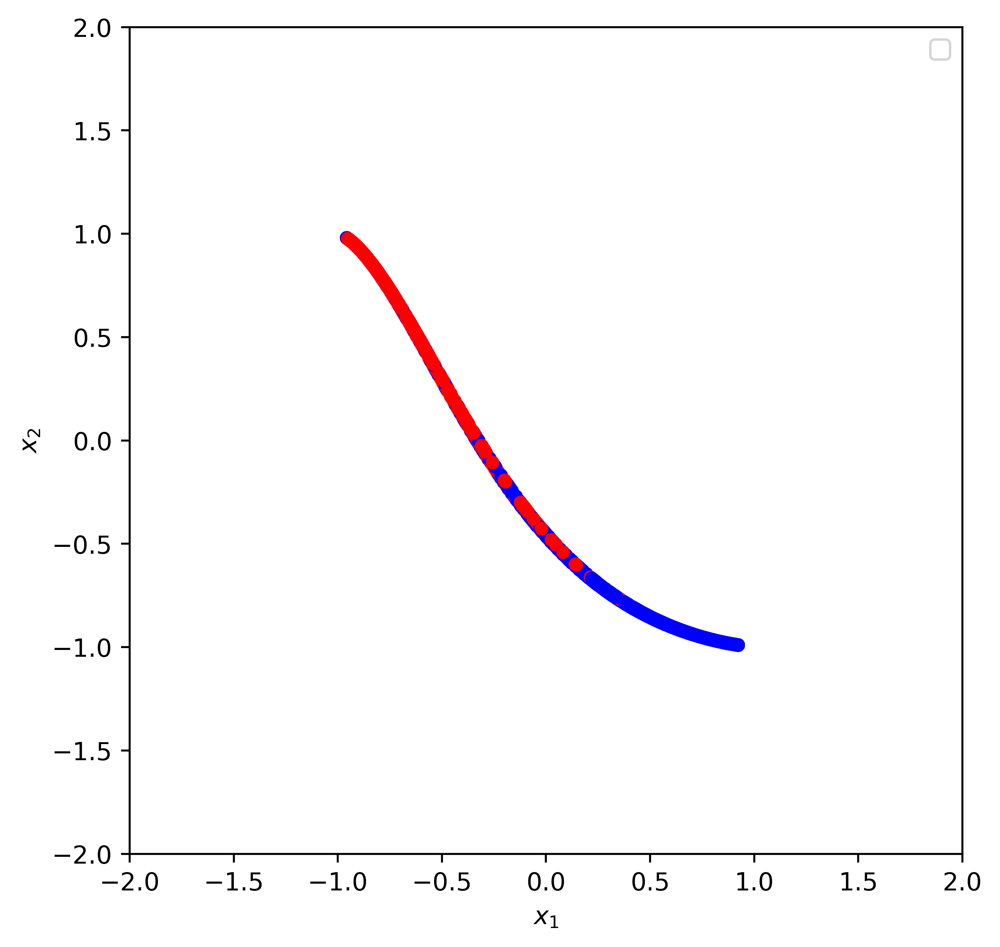

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

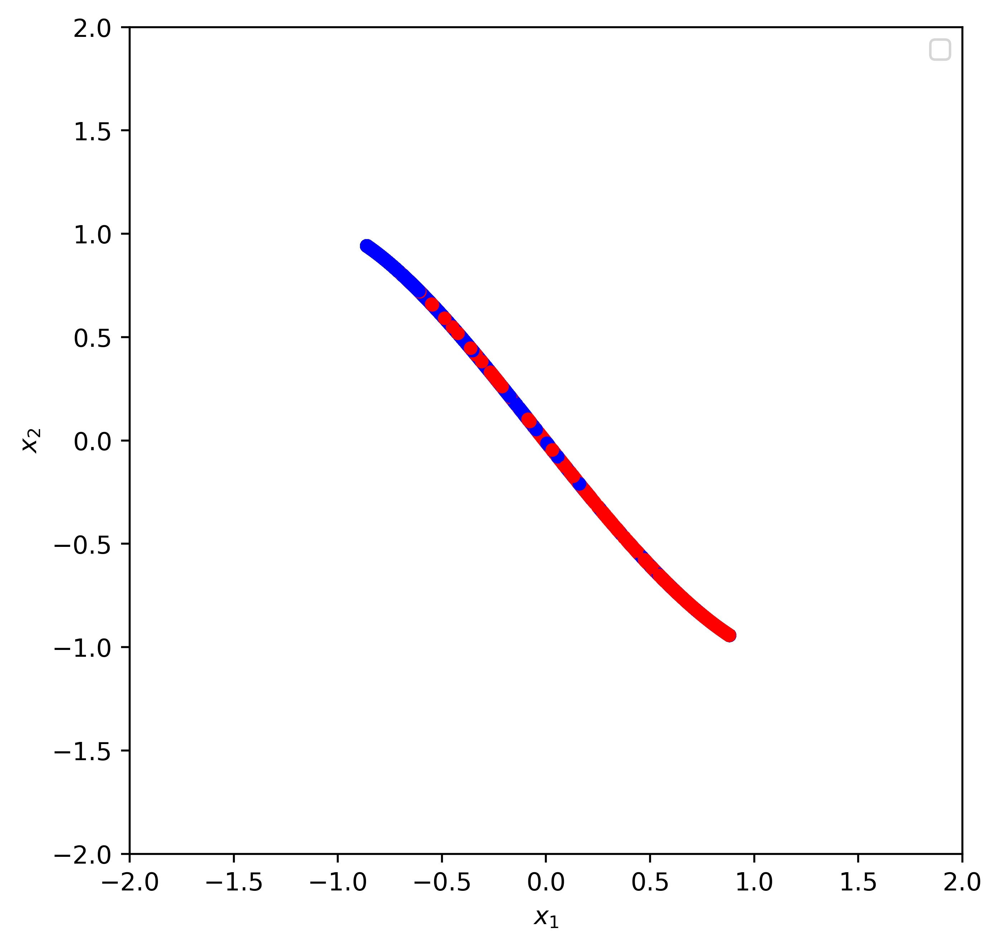

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

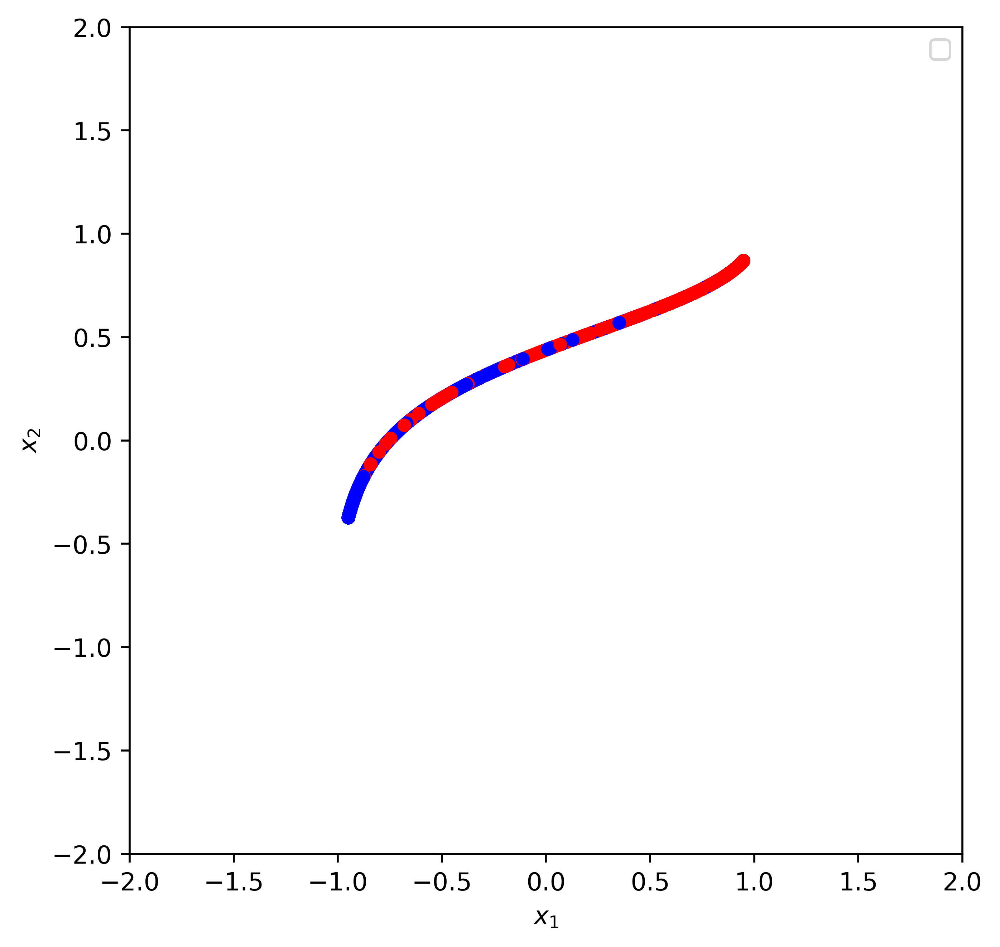

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

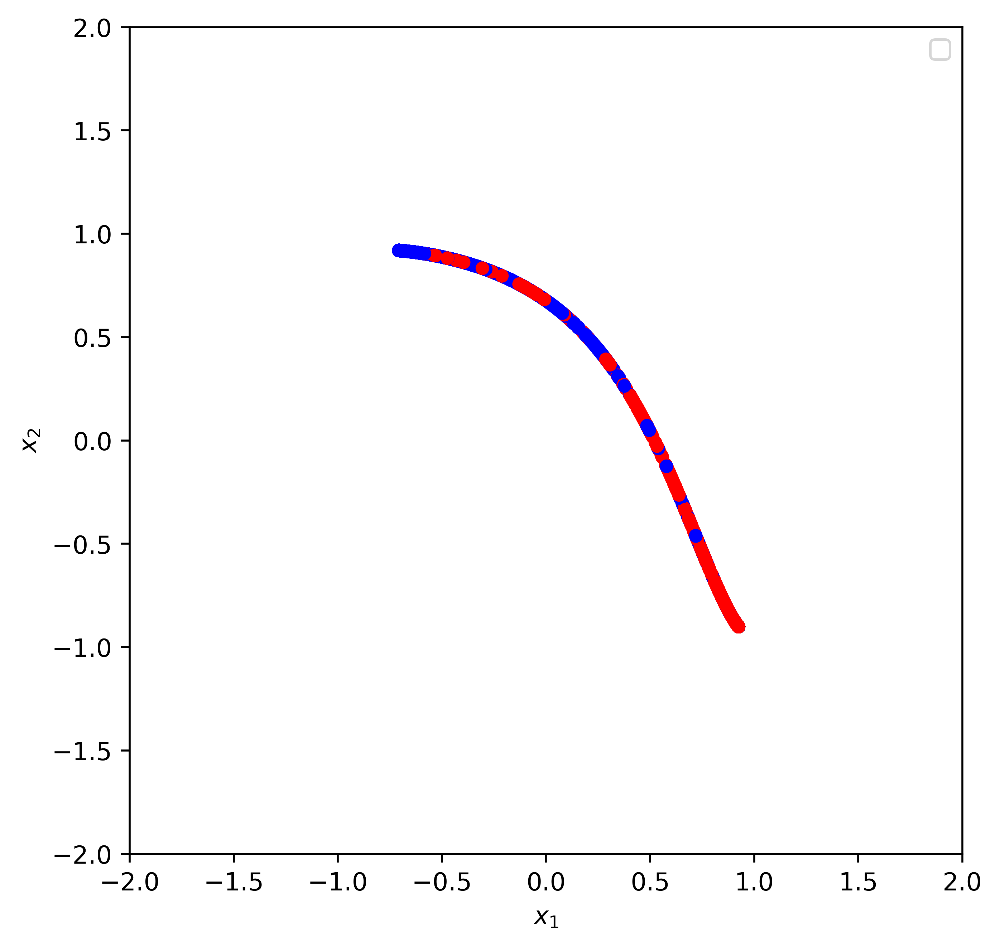

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

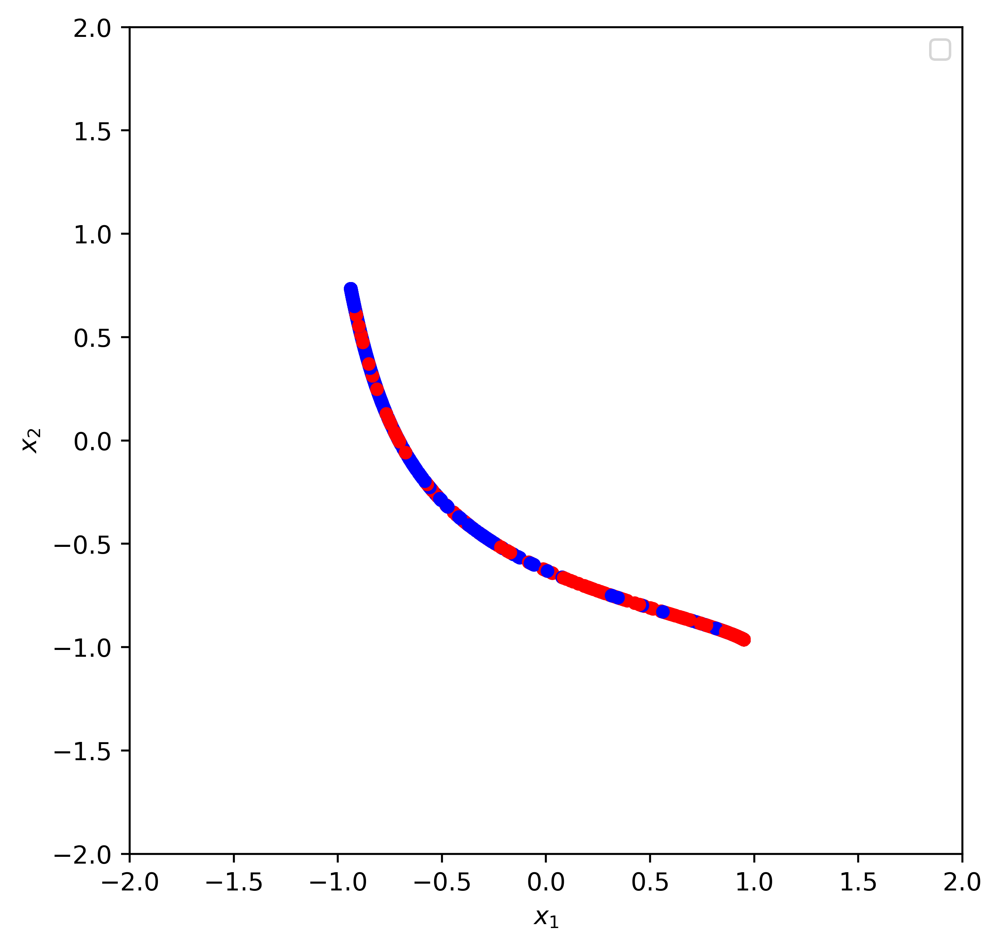

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

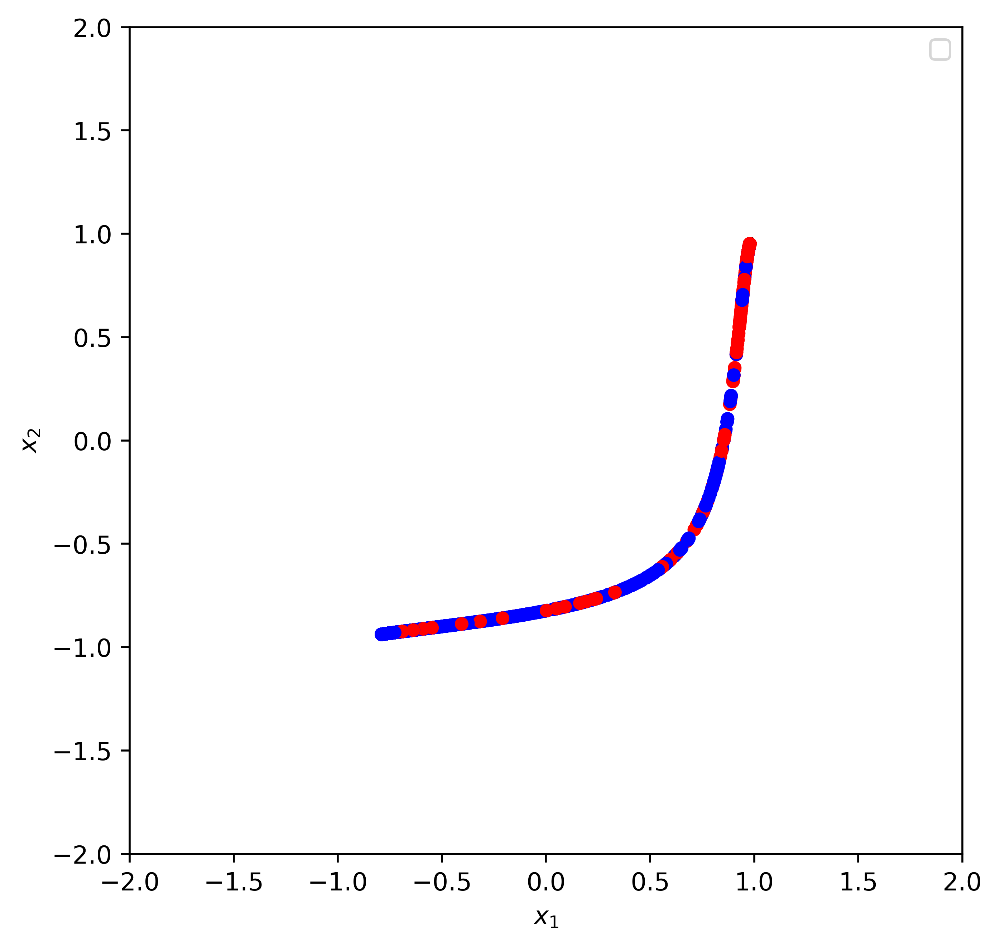

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

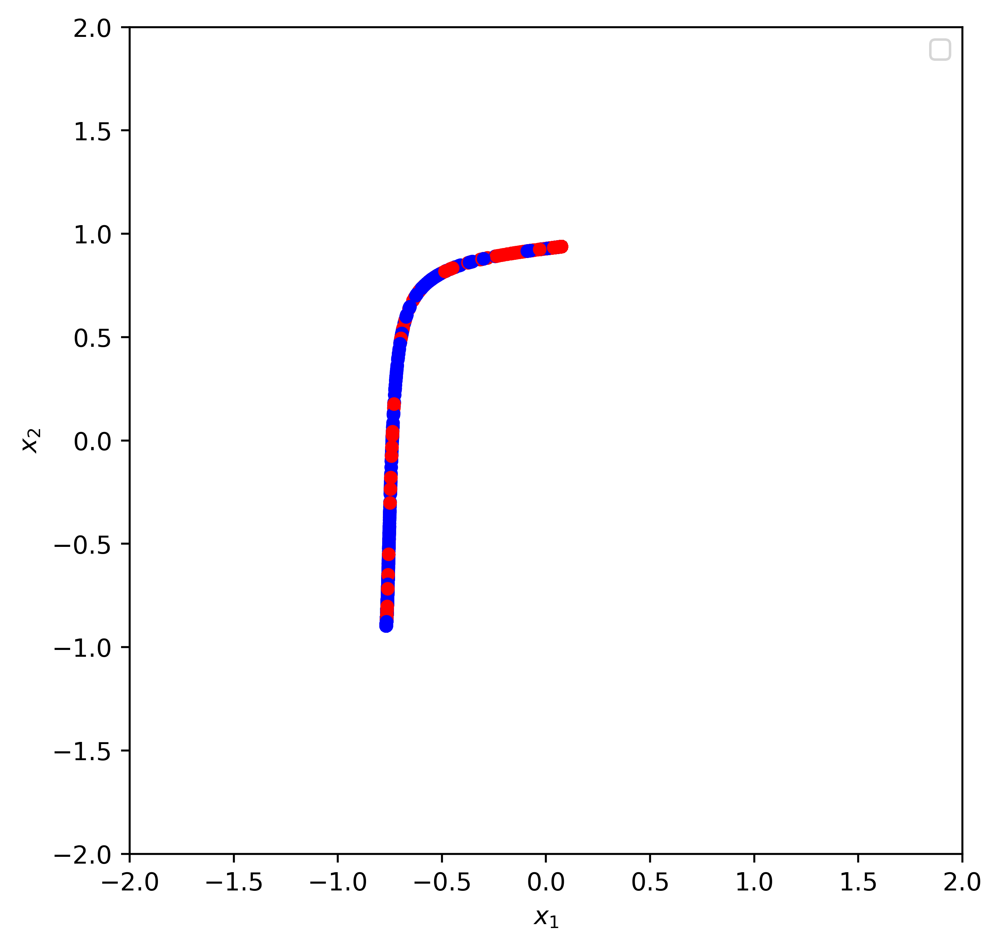

<Figure size 640x480 with 0 Axes>

In [35]:
for i, points in enumerate(transformed_sequences):
    plt.figure(figsize=(6, 6), dpi=500)
    plt.scatter(points.detach().cpu()[:, 0], points.detach().cpu()[:, 1], c=colors, s=20)
    plt.legend()
    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")
    plt.xlim(-2, 2)
    plt.ylim(-2, 2)
    fig_cur = plt.gcf()
    plt.show()
    plt.draw()
    # Save the plot
    
    save_path = f"net_images/network_flow/layer_{i + 1}.png"
    fig_cur.savefig(save_path, bbox_inches='tight')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


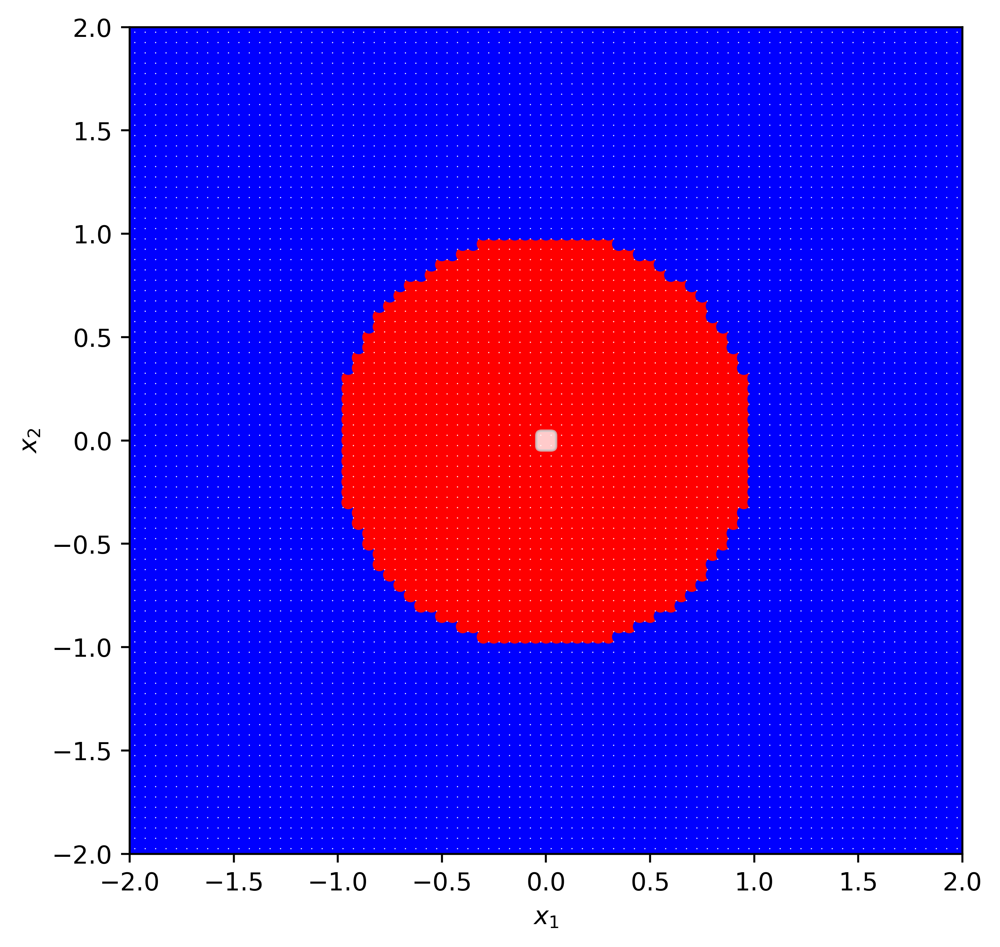

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

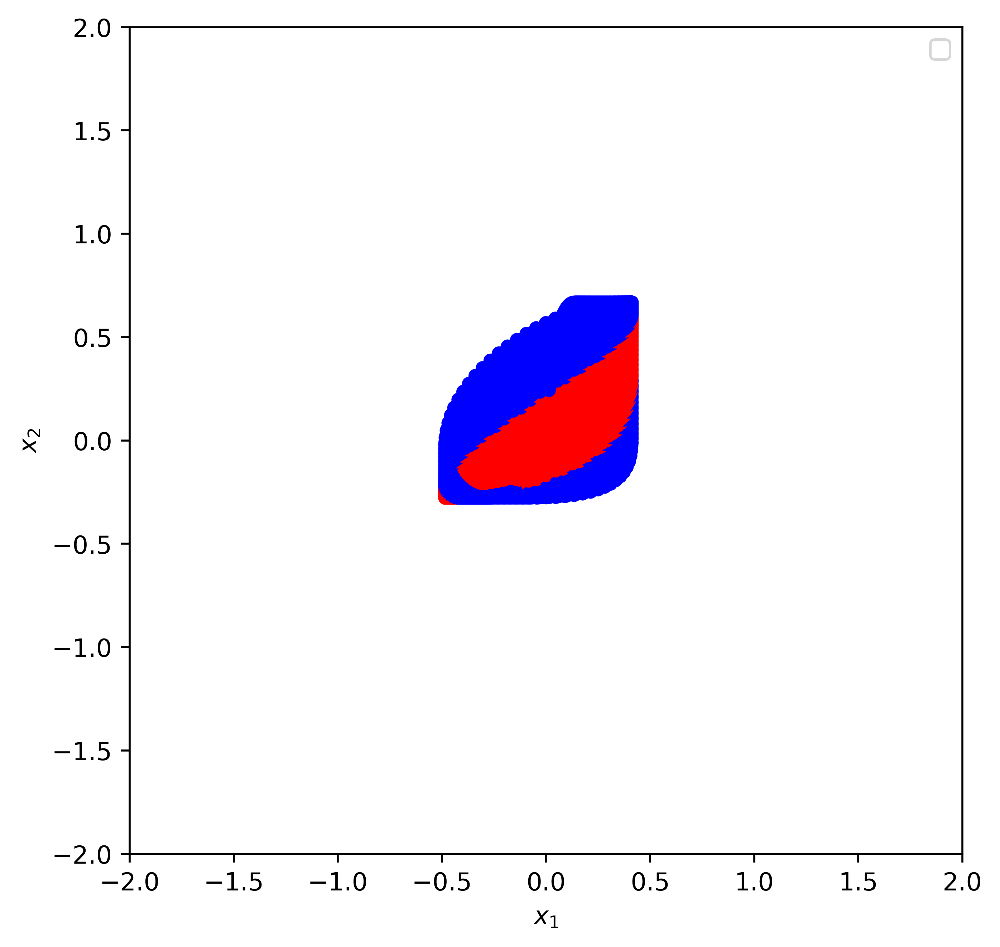

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

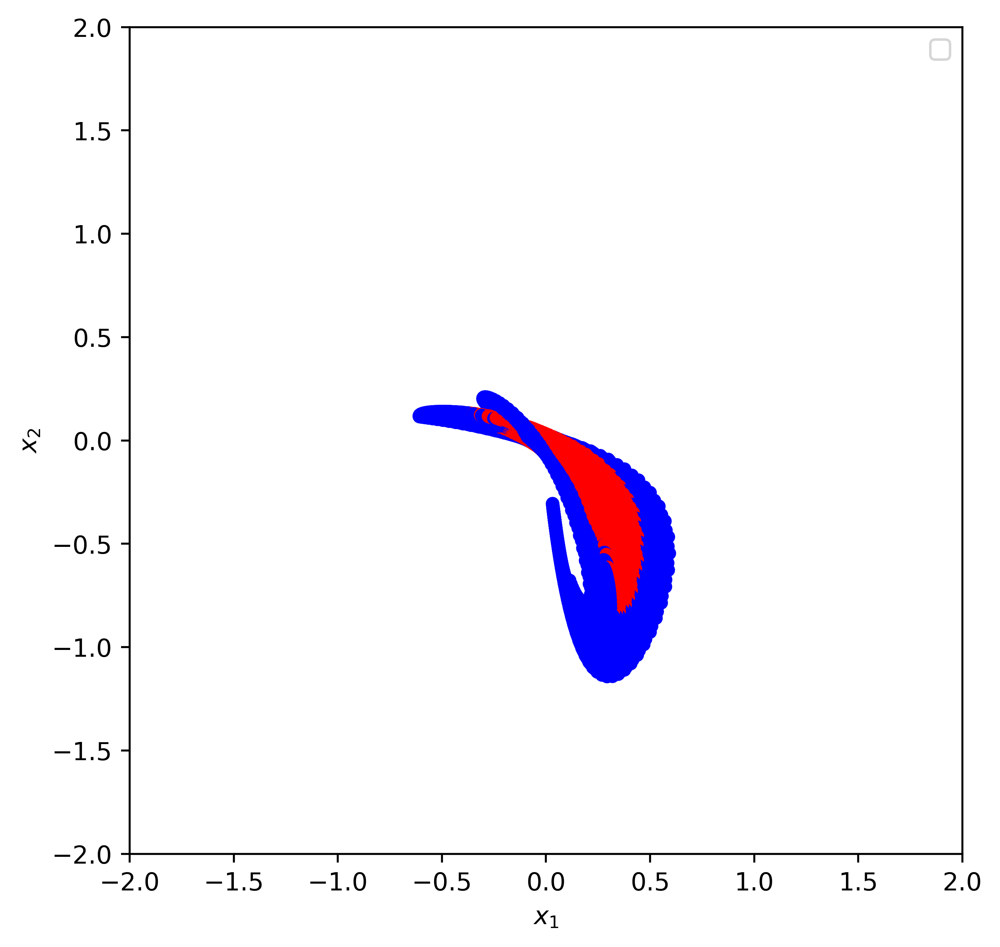

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

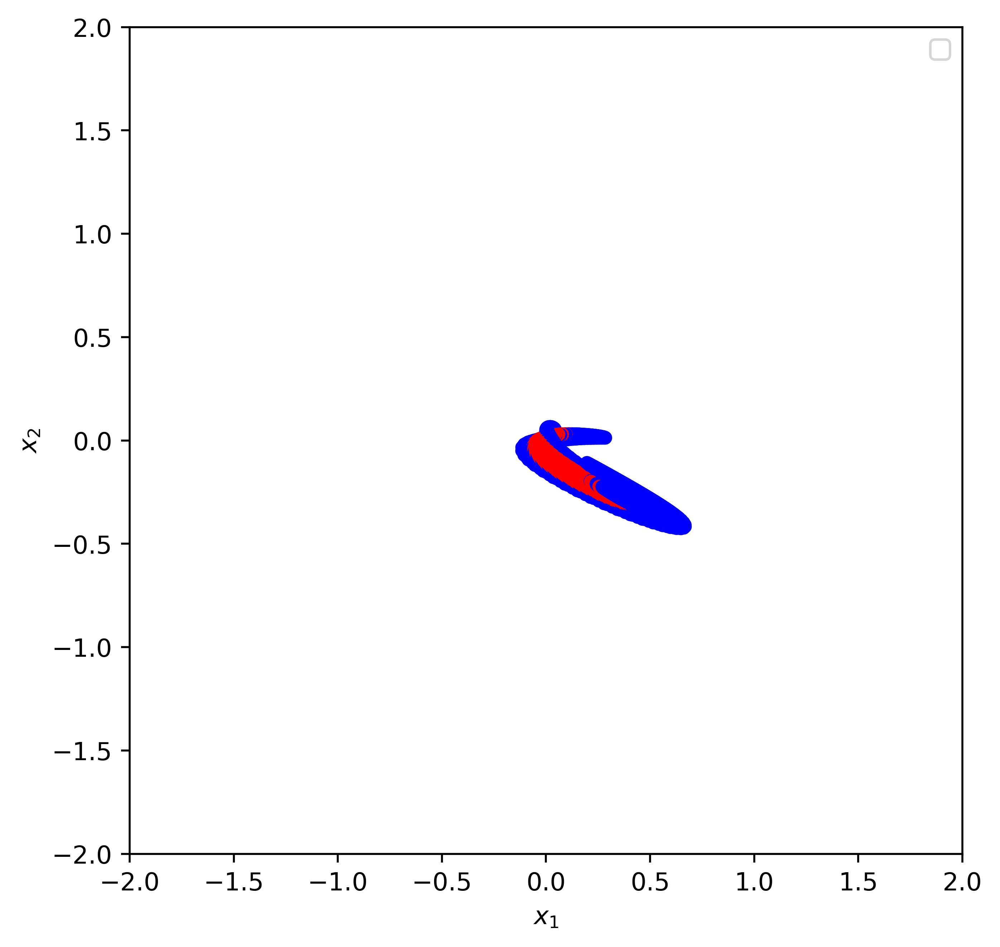

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

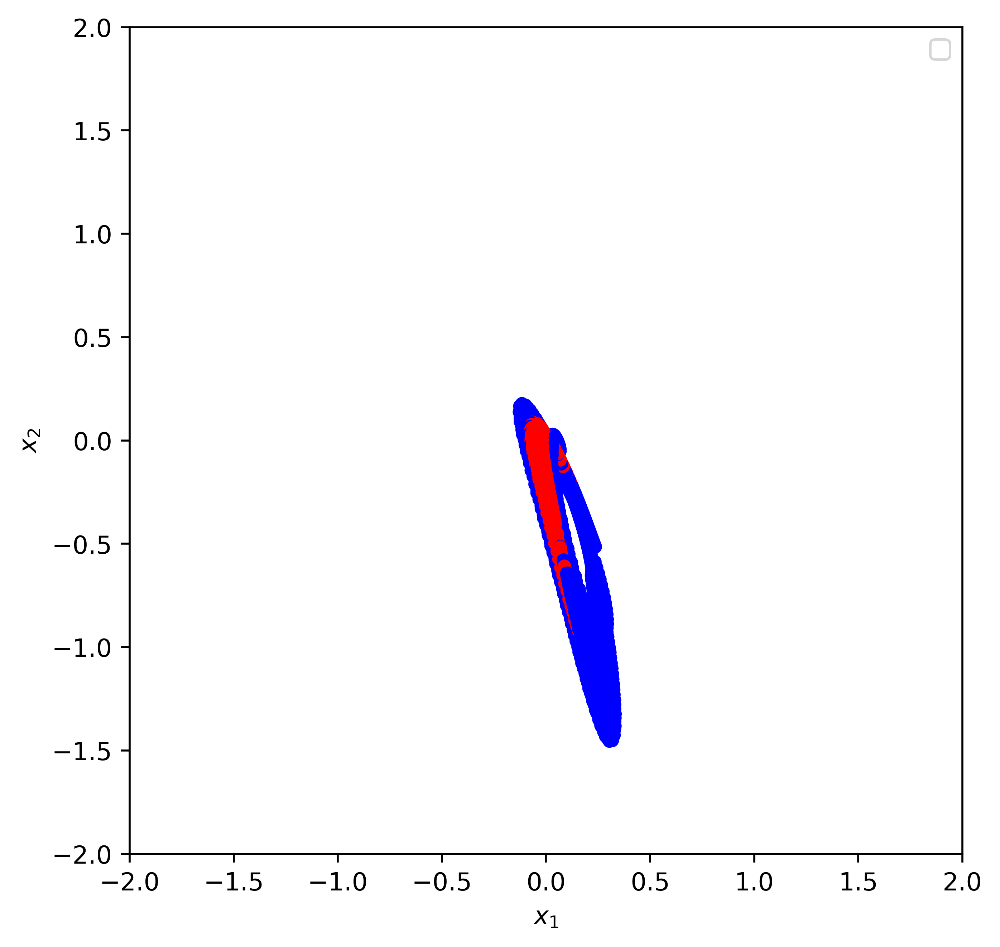

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

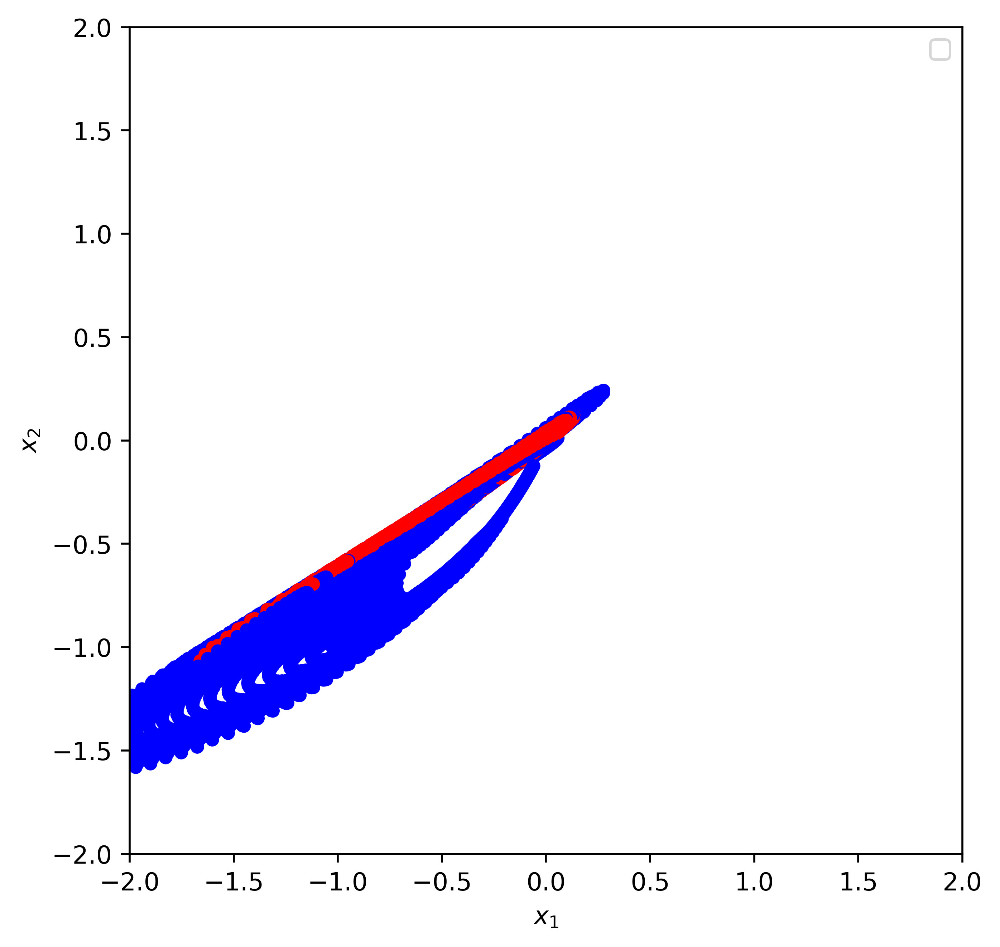

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

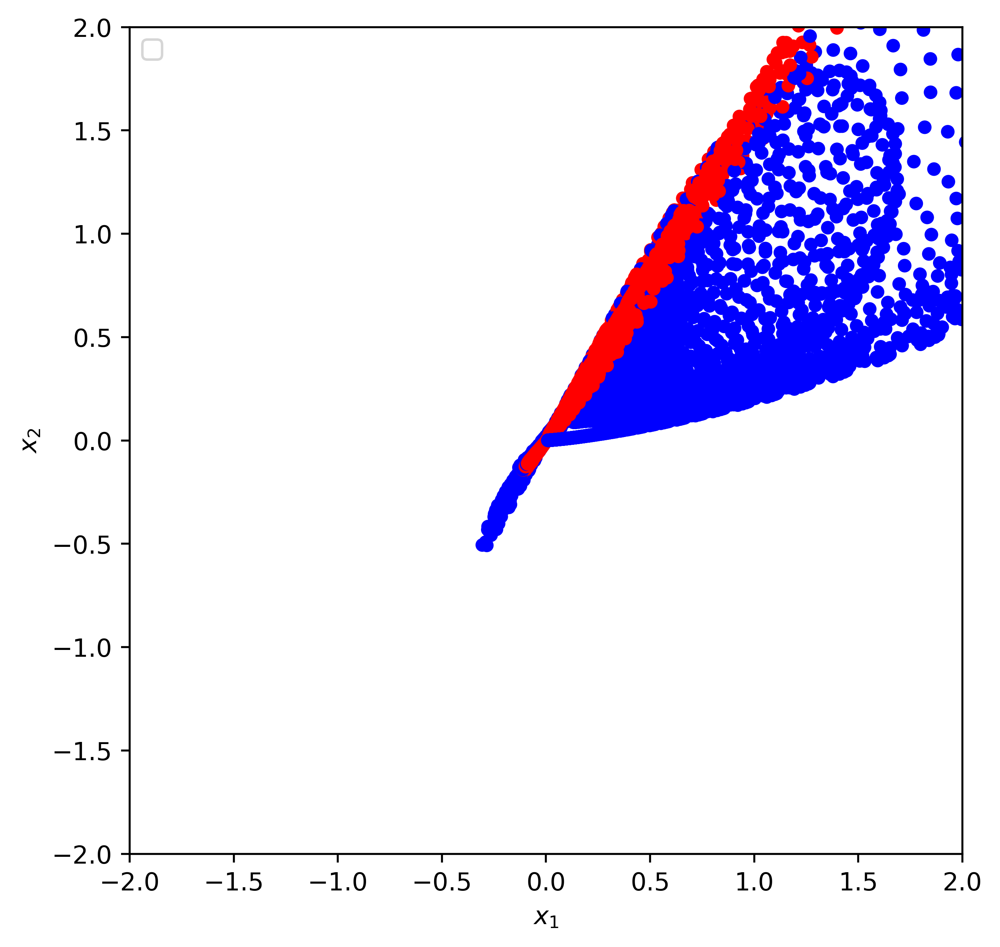

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

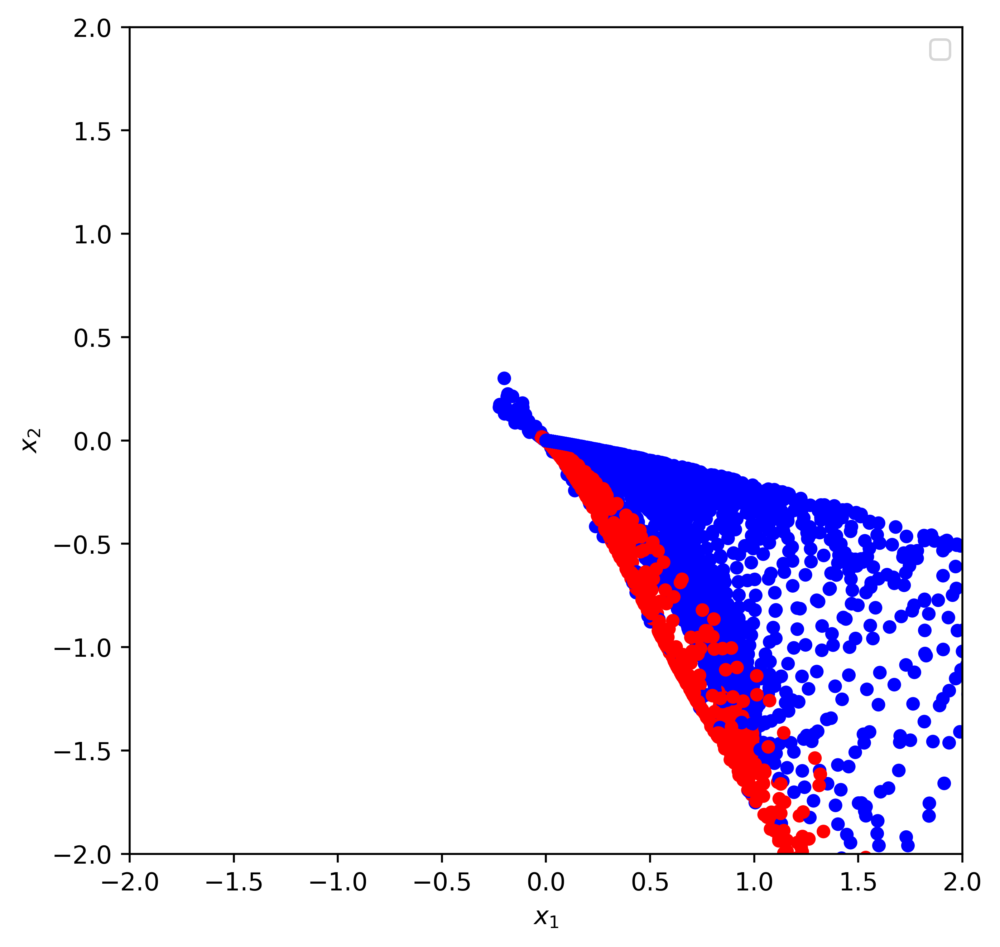

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

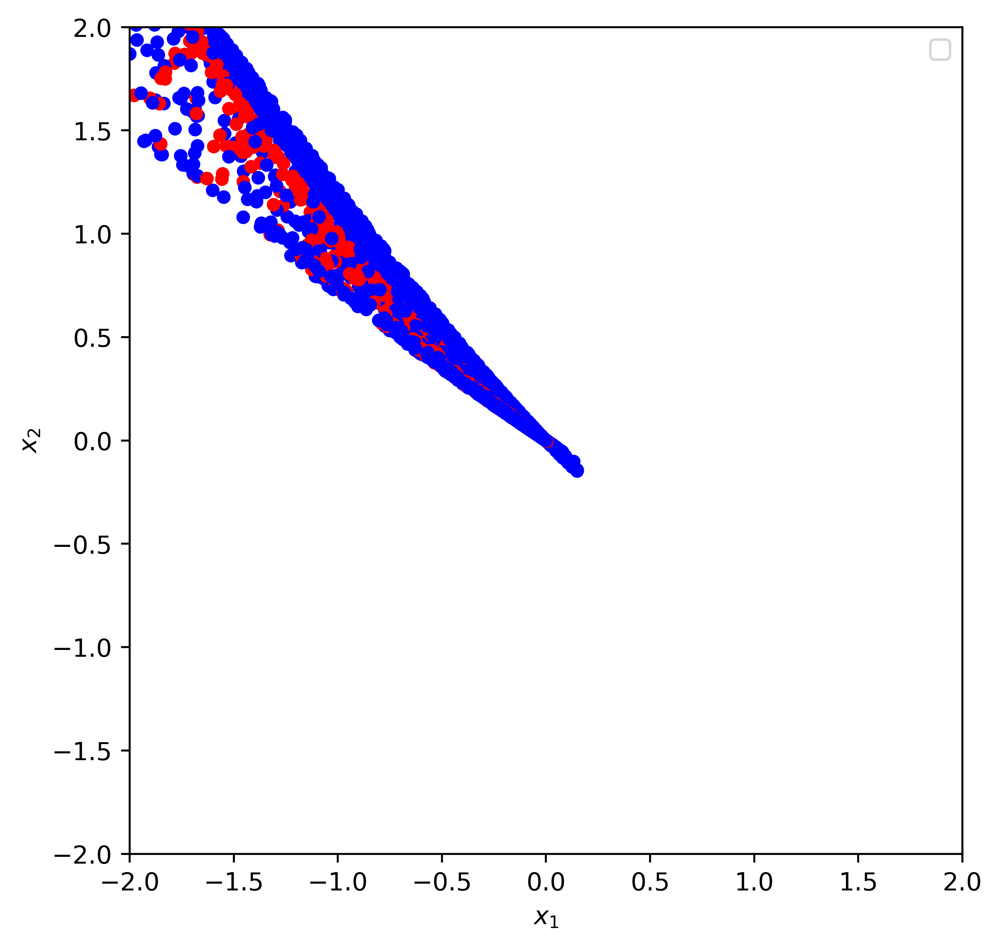

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

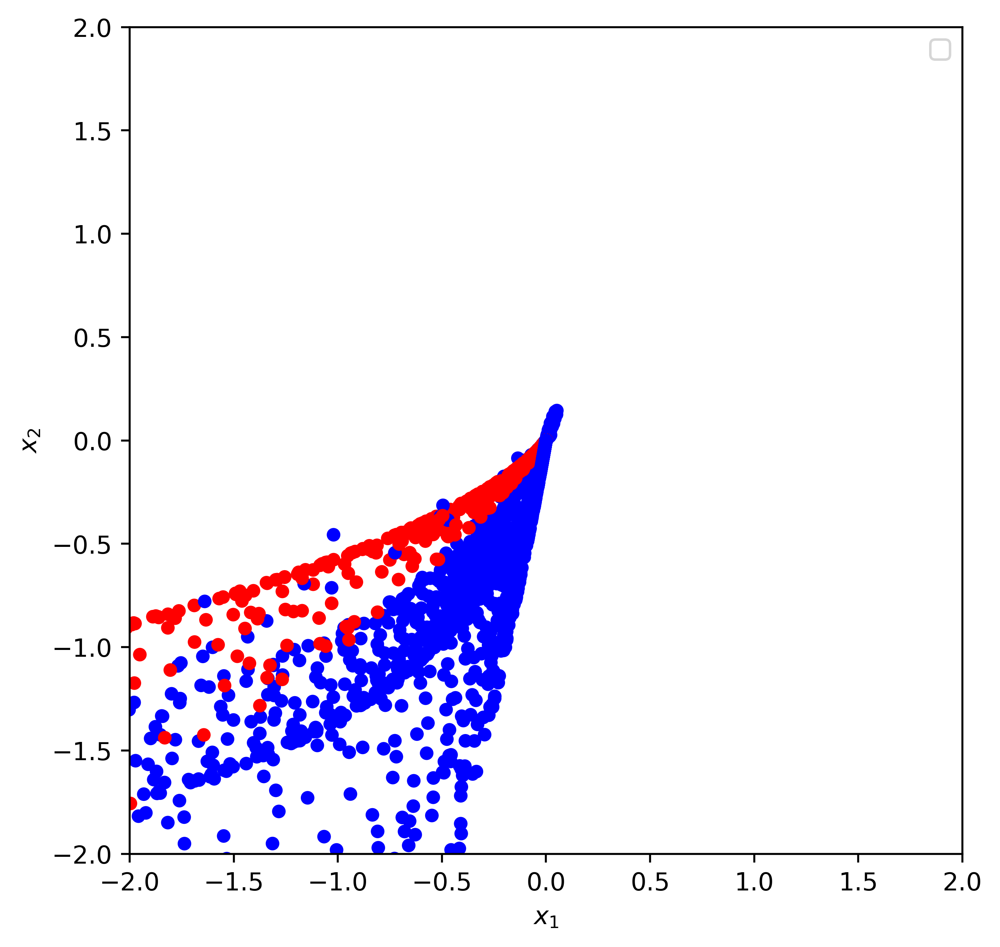

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

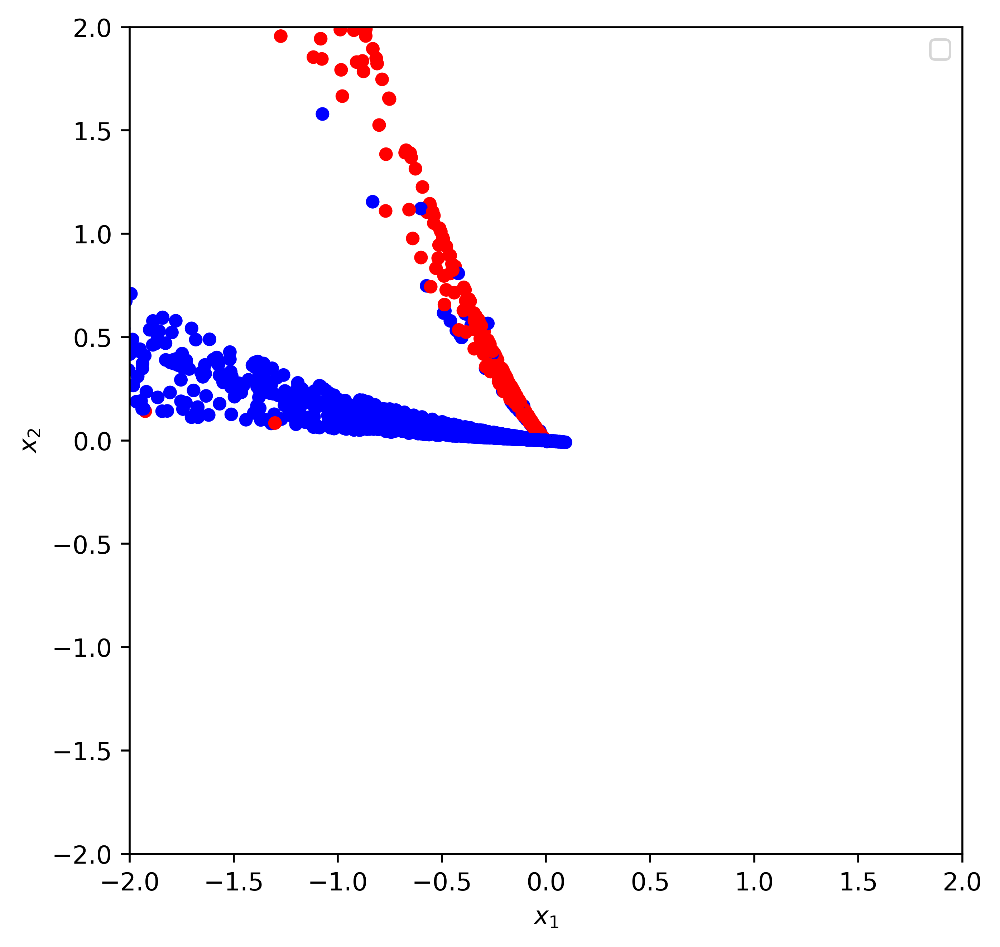

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

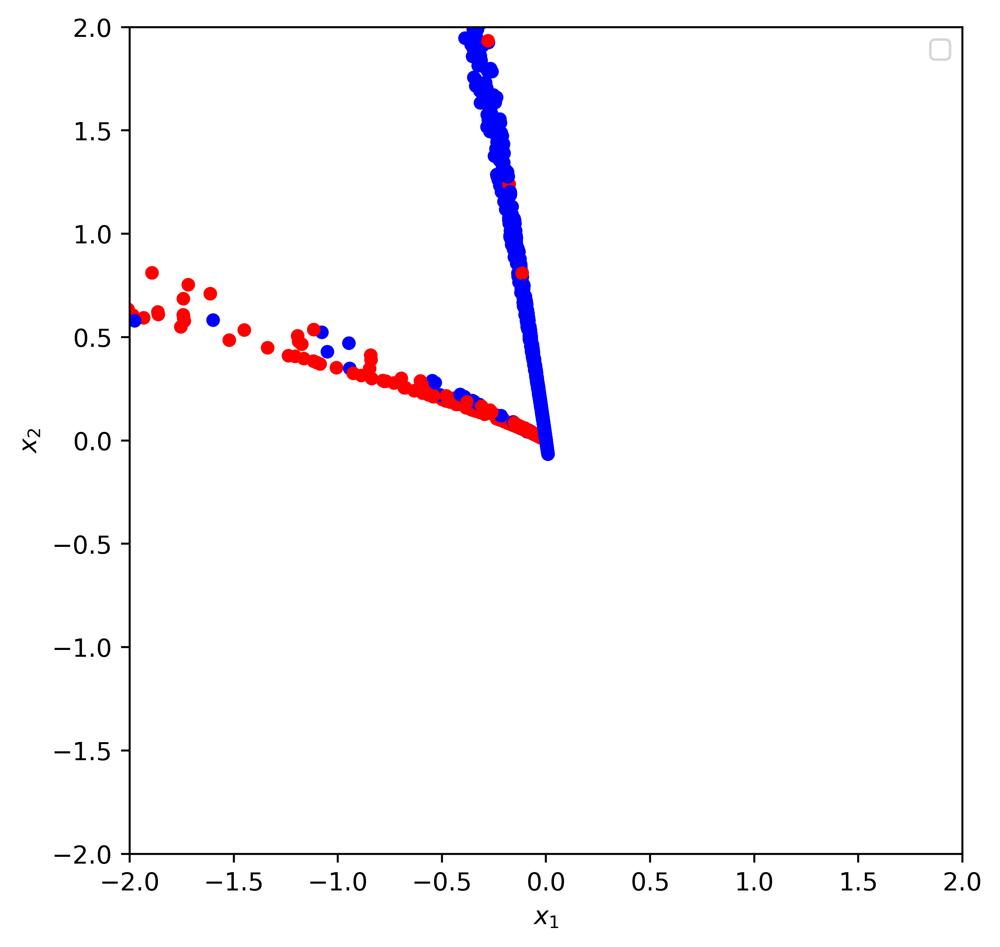

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


<Figure size 640x480 with 0 Axes>

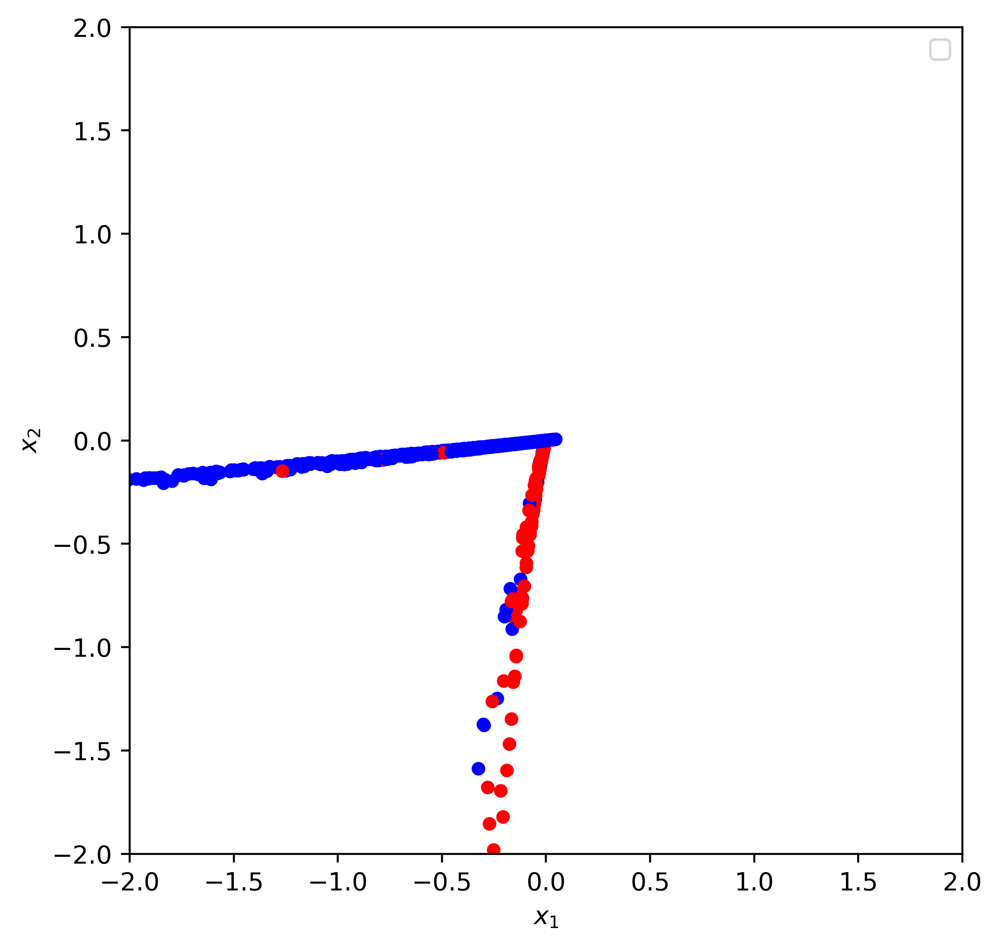

<Figure size 640x480 with 0 Axes>

In [681]:
for i, jacobian in enumerate(jacobian_sequence):
    if i == len(jacobian_sequence)-1:
        break
    plt.figure(figsize=(6, 6), dpi=500)
    plt.scatter(transformed_points[:, 0].detach().cpu(), transformed_points[:, 1].detach().cpu(), c=colors, s=20)
    plt.legend()
    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")
    plt.xlim(-2, 2)
    plt.ylim(-2, 2)
    fig_cur = plt.gcf()
    plt.show()
    plt.draw()
    # Save the plot
    
    save_path = f"net_images/network_flow/layer_{i + 1}.png"
    fig_cur.savefig(save_path, bbox_inches='tight')
        # Save the figure if a save directory is provided
    transformed_points = torch.einsum('ij,ikj->ik', transformed_points, jacobian)

In [ ]:
# for i, jacobian in enumerate(jacobian_sequence):
#     if i == len(jacobian_sequence)-1:
#         break
#     # Ensure jacobian is properly detached and moved to the correct device
#     jacobian = jacobian[0]  # Extract the layer-specific Jacobian matrix
#     transformed_points = transformed_points @ jacobian.T  # Matrix multiplication

#     # Plot the transformed points
#     plt.figure(figsize=(8, 6))
#     plt.scatter(
#         transformed_points[:, 0].detach().cpu().numpy(),
#         transformed_points[:, 1].detach().cpu().numpy(),
#         s=10,
#         alpha=0.7
#     )
#     plt.title(f"Layer {i + 1} Transformation")
#     plt.xlabel("$x_1$")
#     plt.ylabel("$x_2$")
#     plt.xlim(-2, 2)
#     plt.ylim(-2, 2)
#     plt.grid(True)

#     # # Save the figure if a save directory is provided
#     # if save_dir:
#     #     save_path = f"{save_dir}/layer_{i + 1}.png"
#     #     plt.savefig(save_path, bbox_inches="tight")
#     #     print(f"Saved layer {i + 1} plot to {save_path}")

#     plt.show()

N L EPOCHS
5 2 2000

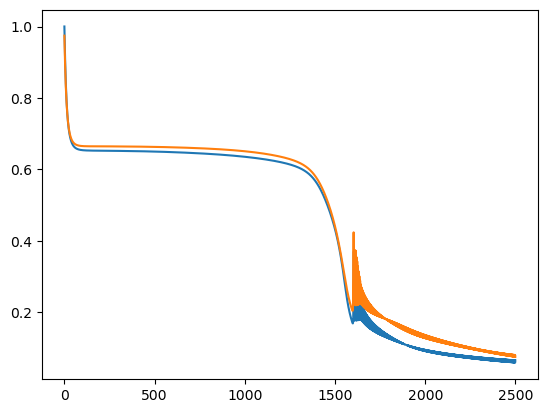

In [63]:
plt.plot(range(len(net.train_losses)), net.train_losses)
plt.plot(range(len(net.val_losses)), net.val_losses)
plt.show()

In [64]:
n_list = [5, 10, 50, 250]
ell_list = [2, 4, 8, 12]

networks_params={}


In [65]:
for i, n in enumerate(n_list):
    for j, ell in enumerate(ell_list):
        # print(f"{i*len(n_list)+j+1}:", n, ell)
        k = (i*len(n_list)+j+1)
        networks_params[f"NET_{k}"] = {
            "net_params": 
            {
                "N": n,
                "L": ell,
                "input_dim": 2,
                "output_dim": 1,
                "activations": None
            },
            "fit_params":
            {
                "optimizer_cls" : optim.SGD,
                "loss_fn" : nn.MSELoss,
                "lr" : 0.01,
                "num_epochs": 2500,
                "batch_size": None,
                "metric_fn": accuracy_fn,
                "print_every": 500,
                "early_stopping": False if k < 14 else True,
                "window_size": None if k < 14 else 300
            }
        }
    

In [66]:
networks = {}

In [67]:
for i in range(1,17):
    net_params = networks_params[f"NET_{i}"]["net_params"]
    fit_params = networks_params[f"NET_{i}"]["fit_params"]

    net = CustomNet(**net_params).to(DEVICE)
    print(f"Training NET_{i}: (N={net_params['N']}, L={net_params['L']})")
    net.fit(X_train, y_train, X_val, y_val, **fit_params)

    networks[f"NET_{i}"] = {"network": net,
                            "train_losses": net.train_losses,
                            "val_losses": net.val_losses}
    print("\n")

Training NET_1: (N=5, L=2)
Epoch [1/2500] | Train Loss: 1.0169, Train Metric: 0.4967, Val Loss: 1.0069, Val Metric: 0.5000
Epoch [500/2500] | Train Loss: 0.5915, Train Metric: 0.7953, Val Loss: 0.6048, Val Metric: 0.7900
Epoch [1000/2500] | Train Loss: 0.4085, Train Metric: 0.8914, Val Loss: 0.4033, Val Metric: 0.8700
Epoch [1500/2500] | Train Loss: 0.2150, Train Metric: 0.9575, Val Loss: 0.2174, Val Metric: 0.9650
Epoch [2000/2500] | Train Loss: 0.1181, Train Metric: 0.9806, Val Loss: 0.1175, Val Metric: 0.9900
Epoch [2500/2500] | Train Loss: 0.0844, Train Metric: 0.9864, Val Loss: 0.0817, Val Metric: 0.9900
Training complete.


Training NET_2: (N=5, L=4)
Epoch [1/2500] | Train Loss: 1.0609, Train Metric: 0.4961, Val Loss: 1.0522, Val Metric: 0.5000
Epoch [500/2500] | Train Loss: 0.5215, Train Metric: 0.7953, Val Loss: 0.5313, Val Metric: 0.7900
Epoch [1000/2500] | Train Loss: 0.0845, Train Metric: 0.9883, Val Loss: 0.0854, Val Metric: 0.9900
Epoch [1500/2500] | Train Loss: 0.0468, Tr

In [68]:
for key in networks:
    torch.save(networks[key]["network"], "trained_networks/"+ key + ".pt")

In [307]:
def make_fields(net, x_range, y_range, grid_step=0.05, scale_exponent=False, scale_svectors=False, vector_step=None, cuda=False):
    """
    Parameters
    - net: a trained CustomNetwork instance
    - x_range: List[x_min, x_max]
    - y_range: List[y_min, y_max]
    - grid_step: step size of the resulting grid
    - vector_step: (k) int, print every k'th vector in each row
    """
    x_values = torch.arange(x_range[0], x_range[1] + grid_step, grid_step).to(DEVICE)  # Range for x-axis
    y_values = torch.arange(y_range[0], y_range[1] + grid_step, grid_step).to(DEVICE)  # Range for y-axis

    # Generate the grid
    x_grid, y_grid = torch.meshgrid(x_values, y_values, indexing='ij')
    grid_points = torch.stack([x_grid.flatten(), y_grid.flatten()], dim=1)#.to(DEVICE)

    # Step 2: Compute singular vectors and scaled singular values
    L = len(net.layers) - 2 # Number of layers in the network not counting input & output
    scaled_log_singular_values = []
    vector_field_x = []
    vector_field_y = []

    for point in tqdm(grid_points):
        point = point.unsqueeze(0)  # Add batch dimension
        jacobians = net.compute_last_jacobian(point)  # Compute only the last Jacobian
        jacobian = jacobians.squeeze(0)  # Shape: (output_dim, input_dim)
        
        # Perform SVD on the Jacobian
        U, S, Vh = torch.linalg.svd(jacobian, full_matrices=False)
        
        # Extract the first singular vector and scaled singular value
        first_singular_vector = Vh[0] if not scale_svectors else Vh[0] * S[0] # First right singular vector
        scaled_log_singular_value = (torch.log(S[0]) if not scale_exponent else torch.log(S[0]) / L).item()  # Scaled logarithm of the first singular value  / L
        
        # Append components of the first singular vector
        vector_field_x.append(first_singular_vector[0].item())
        vector_field_y.append(first_singular_vector[1].item())
        scaled_log_singular_values.append(scaled_log_singular_value)

    # Step 3: Reshape results for visualization
    scaled_log_singular_values = torch.tensor(scaled_log_singular_values).view(x_values.size(0), y_values.size(0)).to(DEVICE)
    vector_field_x = torch.tensor(vector_field_x).view(x_values.size(0), y_values.size(0)).to(DEVICE)
    vector_field_y = torch.tensor(vector_field_y).view(x_values.size(0), y_values.size(0)).to(DEVICE)

    x_grid, y_grid = x_grid[::vector_step, ::vector_step], y_grid[::vector_step, ::vector_step]
    vector_field_x, vector_field_y = vector_field_x[::vector_step, ::vector_step], vector_field_y[::vector_step, ::vector_step]
    return {"FTLEs": scaled_log_singular_values.T if cuda else scaled_log_singular_values.cpu().T,
            "grid": (x_grid, y_grid) if cuda else (x_grid.cpu(), y_grid.cpu()),
            "vector_field": (vector_field_x, vector_field_y) if cuda else (vector_field_x.cpu(), vector_field_y.cpu())}




In [292]:
total_results = []
for key in networks:
    total_results.append(make_fields(networks[key]["network"], [-2, 2], [-2, 2], grid_step=0.05, vector_step=None, cuda=False, scale_svectors=True))


100%|██████████| 6561/6561 [00:17<00:00, 365.50it/s]


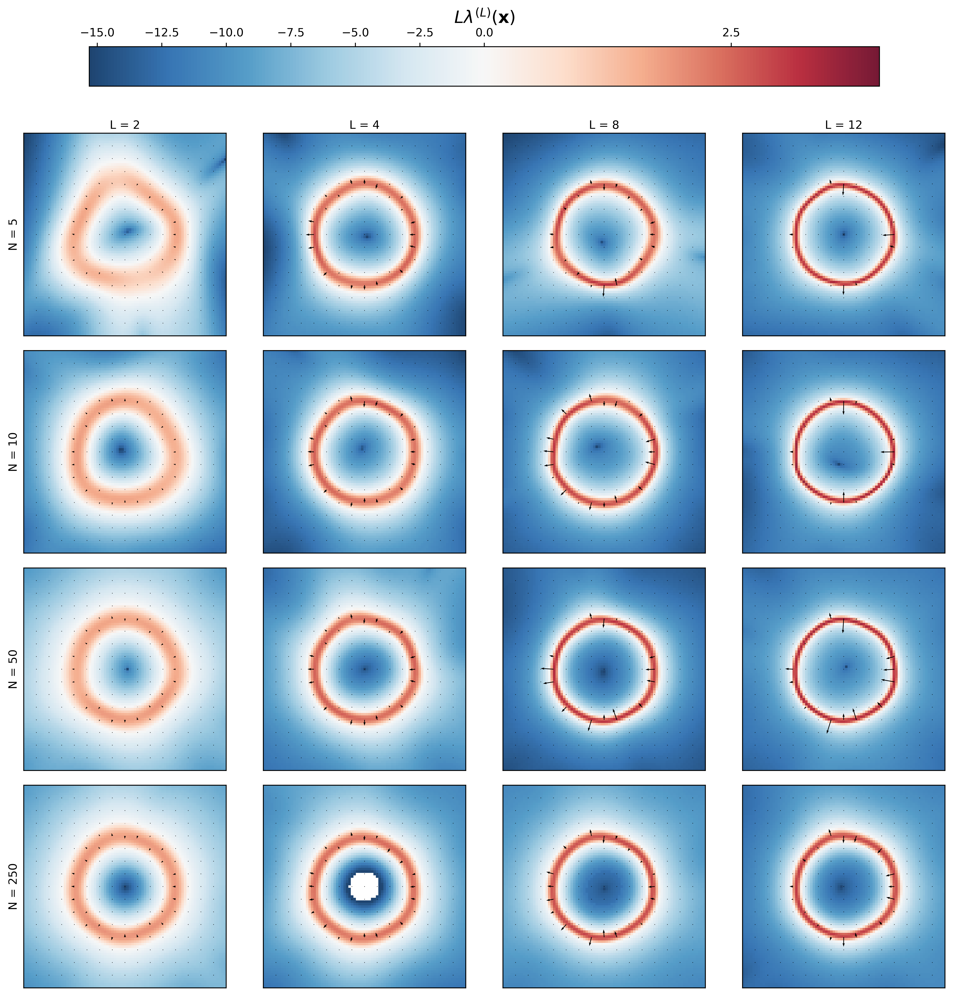

In [379]:
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# Assume scaled_log_singular_values_list and vector_fields_list are given
# Each contains 16 elements corresponding to grids
# scaled_log_singular_values_list: List of 2D numpy arrays
# vector_fields_list: List of (vector_field_x, vector_field_y) tuples (2D numpy arrays)
step = 5

# Create the figure
fig, axes = plt.subplots(4, 4, figsize=(12, 12), dpi=500)
axes = axes.flatten()
theta = np.linspace(0, 2*np.pi, 100)
x = np.cos(theta)
y = np.sin(theta)


# Iterate over each grid
for i, result in enumerate(total_results):
    ax = axes[i]
    lyapunov_exponents = result["FTLEs"]
    x_grid, y_grid = result["grid"]
    x_grid, y_grid = x_grid[::step, ::step], y_grid[::step, ::step]

    vector_field_x, vector_field_y = result["vector_field"]
    vector_field_x, vector_field_y = vector_field_x[::step, ::step], vector_field_y[::step, ::step]
    
    # Plot the heatmap
    im = ax.imshow(lyapunov_exponents,
                   extent=(-2, 2, -2, 2),
                   origin='lower',
                   cmap='RdBu_r',
                   alpha=0.9,
                   norm=TwoSlopeNorm(vcenter=0, vmax=4))
    
    # Add vector field
    ax.quiver(
        x_grid, y_grid,  # Downsample the grid for clearer arrows
        vector_field_x, vector_field_y, 
        color='black',
        # width=0.004,
        scale=400,
        # headlength=0,
        # headaxislength=0
    )
    # theta = np.linspace(0, 2*np.pi, 100)
    

    # ax.plot(x,y, color='black', alpha=0.3)
    
    # Title and axis settings
    if i in range(4):
        ax.set_xlabel(f"L = {ell_list[i]}")
        ax.xaxis.set_label_position('top') 
    if not i % 4:
        ax.set_ylabel(f"N = {n_list[i//4]}")
    ax.set_xticks([])
    ax.set_yticks([])

# Add a colorbar to the right of the figure

plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.tight_layout()
cbar = fig.colorbar(im, ax=axes.ravel().tolist(),
                    orientation='horizontal',
                    location='top',
                    fraction=0.042, pad=0.05)
cbar.set_label(r"$L\lambda^{(L)}(\mathbf{x})$",fontsize=15)
# cbar.ax.xaxis.set_label_position('top')
# cbar.ax.xaxis.tick_top()
plt.show()


### Images and stuff

In [345]:
net_1 = networks["NET_4"]["network"]
net_1_results = make_fields(net_1, [-1.1, 1.1], [-1.1, 1.1], vector_step=None, cuda=False, scale_svectors=True)

100%|██████████| 2025/2025 [00:05<00:00, 385.69it/s]


In [674]:
net_1_results = make_fields(net, [-2, 2], [-2, 2], scale_svectors=True)

100%|██████████| 6561/6561 [00:16<00:00, 388.09it/s]


In [675]:
lyapunov_exponents_1 = net_1_results["FTLEs"]
x_grid_1, y_grid_1 = net_1_results["grid"]
vector_field_x_1, vector_field_y_1 = net_1_results["vector_field"]
# norm = np.sqrt(vector_field_x_1**2 + vector_field_y_1**2)

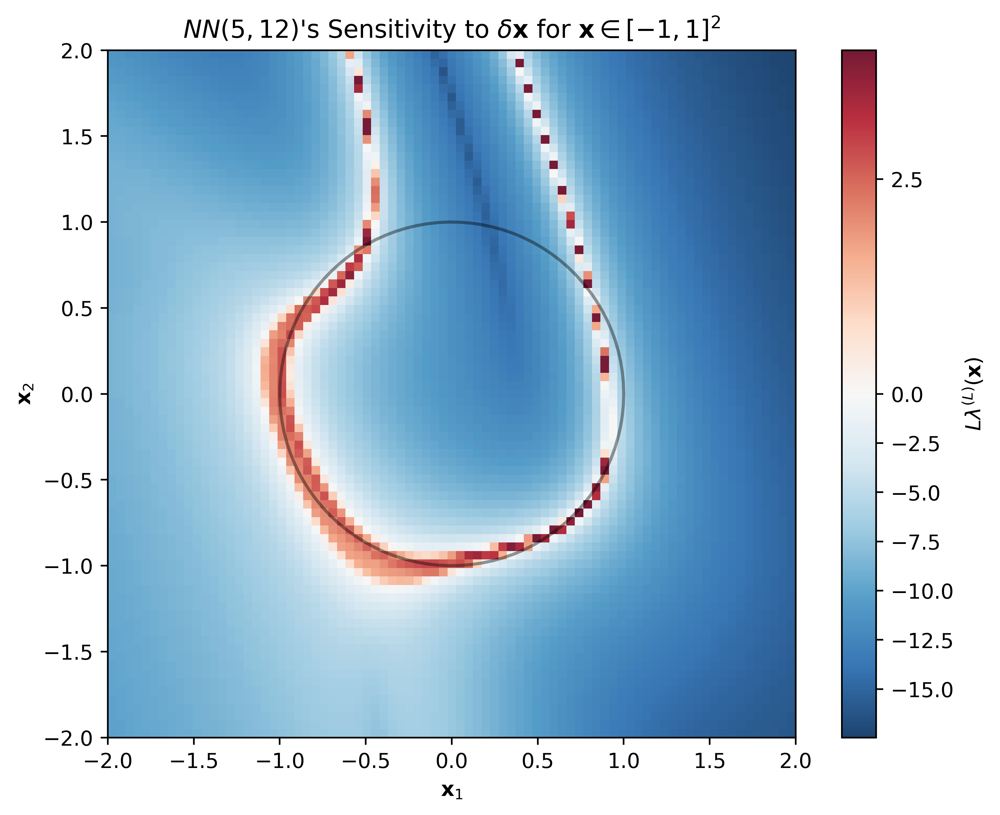

In [678]:


# y_test_pred = net_1.predict(X_test)
# y_test_pred_rounded = torch.where(y_test_pred >= 0, 1, -1)  # Round to -1 or 1

# Convert data to numpy for matplotlib
# X_test_np = X_test.cpu().numpy()  # Shape: (num_points, 2)
# y_test_pred_rounded_np = y_test_pred_rounded.cpu().numpy().flatten()  # Shape: (num_points,)
# y_test_np = y_test.cpu().numpy().flatten()
# Create a colormap for the classes
# colors = np.where(y_test_np == 1, '#14bdc9', 'black')
# alphas = np.where(y_test_np == 1, 1.0, 0.5)

# Scatter plot
plt.figure(figsize=(8, 6), dpi=500)
# plt.scatter(X_test_np[:, 0], X_test_np[:, 1], c=colors, alpha=alphas, edgecolor='k', s=40)

plt.imshow(lyapunov_exponents_1,
           extent=(-2, 2, -2, 2),
           origin='lower',
           cmap='RdBu_r',
           alpha=0.9,
           norm=TwoSlopeNorm(vcenter=0, vmax=4))
cbar = plt.colorbar()
cbar.set_label("$L\lambda^{(L)}(\mathbf{x})$")
# plt.streamplot(
#     x_grid_1.T.numpy(), y_grid_1.T.numpy(),  # Downsample the grid for clearer arrows
#     vector_field_x_1, vector_field_y_1, 
#     color='gray',
#     density=2,
#     # linewidth=0.8,
#     # headlength=0,
#     # headaxislength=0
# )

# plt.quiver(
#     x_grid_1, y_grid_1,  # Downsample the grid for clearer arrows
#     vector_field_x_1, vector_field_y_1, 
#     color='black',
#     scale=500,
#     alpha=0.6
#     # headlength=0,
#     # headaxislength=0
# )

theta = np.linspace(0, 2*np.pi, 100)
x = np.cos(theta)
y = np.sin(theta)
plt.plot(x,y, color='black', alpha=0.4)


plt.title(f"$NN({net_1.layers[1].out_features}, {len(net_1.layers)-2})$'s "+r"Sensitivity to $ \delta \mathbf{x}$ for $\mathbf{x}\in [-1, 1]^2$")
plt.xlabel("$\mathbf{x}_1$")
plt.ylabel("$\mathbf{x}_2$")
# plt.grid(True)
plt.show()


Moons

In [252]:
from sklearn.datasets import make_moons
import torch

# Parameters for the dataset
n_samples = 4000
noise = 0.1  # Adjust for desired overlap between classes

# Generate the dataset using sklearn
X, y = make_moons(n_samples=n_samples, noise=noise, random_state=42)

# Find the min and max values of X
X_min = X.min(axis=0)
X_max = X.max(axis=0)

# Scale X to the range [-2, 2]
X_scaled = 4 * (X - X_min) / (X_max - X_min) - 2

# Convert to PyTorch tensors
X_tensor = torch.tensor(X_scaled, dtype=torch.float32).to(DEVICE)  # Features
y_tensor = (torch.tensor(y, dtype=torch.float32).reshape(-1,1) * 2. - 1.).to(DEVICE)         # Labels



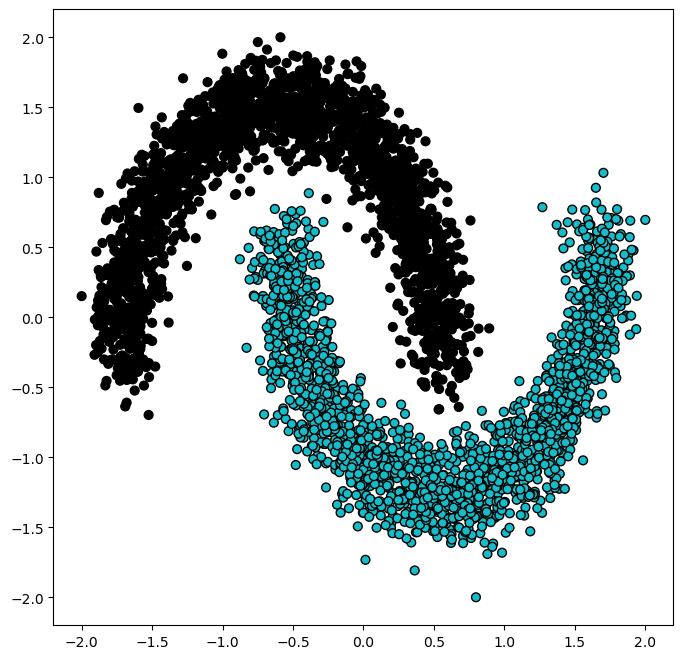

In [254]:
X_tensor_np = X_tensor.cpu().numpy()  # Shape: (num_points, 2)
y_tensor_np = y_tensor.cpu().numpy().flatten()
# Create a colormap for the classes
colors = np.where(y_tensor_np == 1, '#14bdc9', 'black')
# alphas = np.where(y_tensor_np == 1, 1.0, 0.5)
# Scatter plot
plt.figure(figsize=(8, 8))
plt.scatter(X_tensor_np[:, 0], X_tensor_np[:, 1], c=colors, edgecolor='k', s=40)
plt.show()

In [255]:
X_train_moons, X_test_moons, y_train_moons, y_test_moons = train_test_split(X_tensor, y_tensor, test_size=0.2, random_state=42)
X_val_moons, X_test_moons, y_val_moons, y_test_moons = train_test_split(X_test_moons, y_test_moons, test_size=0.5, random_state=42)

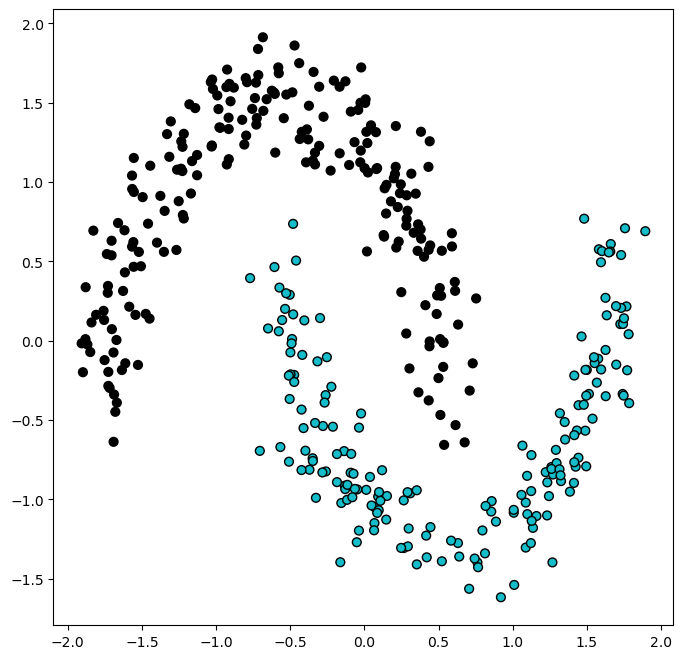

In [256]:
X_tensor_np = X_val_moons.cpu().numpy()  # Shape: (num_points, 2)
y_tensor_np = y_val_moons.cpu().numpy().flatten()
# Create a colormap for the classes
colors = np.where(y_tensor_np == 1, '#14bdc9', 'black')
# alphas = np.where(y_tensor_np == 1, 1.0, 0.5)
# Scatter plot
plt.figure(figsize=(8, 8))
plt.scatter(X_tensor_np[:, 0], X_tensor_np[:, 1], c=colors, edgecolor='k', s=40)
plt.show()

In [258]:
N = 5
L = 4
input_dim = 2
output_dim = 1


torch.manual_seed(42)


net = CustomNet(N, L, input_dim, output_dim).to(DEVICE)

In [259]:
net.fit(X_train_moons, y_train_moons, X_val_moons, y_val_moons,
        optimizer_cls=optim.SGD, loss_fn=nn.MSELoss, lr=0.01,
        num_epochs=2000, batch_size=None, metric_fn=accuracy_fn,
        print_every=100)

Epoch [1/2000] | Train Loss: 0.8327, Train Metric: 0.8522, Val Loss: 0.8137, Val Metric: 0.8725
Epoch [100/2000] | Train Loss: 0.3975, Train Metric: 0.8697, Val Loss: 0.3637, Val Metric: 0.8900
Epoch [200/2000] | Train Loss: 0.3466, Train Metric: 0.8831, Val Loss: 0.3224, Val Metric: 0.8975
Epoch [300/2000] | Train Loss: 0.3124, Train Metric: 0.8866, Val Loss: 0.2963, Val Metric: 0.8950
Epoch [400/2000] | Train Loss: 0.2541, Train Metric: 0.9116, Val Loss: 0.2492, Val Metric: 0.9125
Epoch [500/2000] | Train Loss: 0.1717, Train Metric: 0.9537, Val Loss: 0.1773, Val Metric: 0.9500
Epoch [600/2000] | Train Loss: 0.1077, Train Metric: 0.9753, Val Loss: 0.1170, Val Metric: 0.9750
Epoch [700/2000] | Train Loss: 0.0713, Train Metric: 0.9856, Val Loss: 0.0811, Val Metric: 0.9800
Epoch [800/2000] | Train Loss: 0.0505, Train Metric: 0.9909, Val Loss: 0.0601, Val Metric: 0.9875
Epoch [900/2000] | Train Loss: 0.0378, Train Metric: 0.9934, Val Loss: 0.0469, Val Metric: 0.9900
Epoch [1000/2000] | Tr

In [260]:
pred_moons = net.predict(X_train_moons)
y_train_pred_moons = torch.where(pred_moons >= 0, 1., -1.)

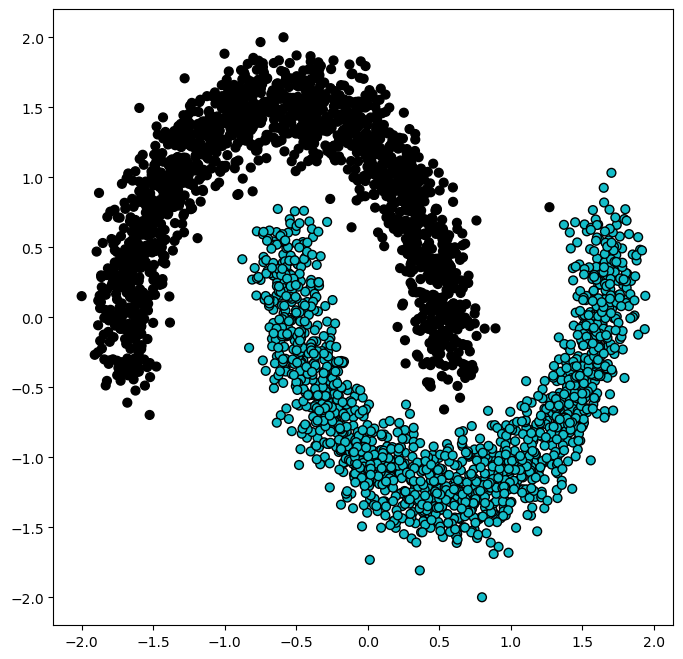

In [261]:
X_tensor_np = X_train_moons.cpu().numpy()  # Shape: (num_points, 2)
y_tensor_np = y_train_pred_moons.cpu().numpy().flatten()
# Create a colormap for the classes
colors = np.where(y_tensor_np == 1, '#14bdc9', 'black')
# alphas = np.where(y_tensor_np == 1, 1.0, 0.5)
# Scatter plot
plt.figure(figsize=(8, 8))
plt.scatter(X_tensor_np[:, 0], X_tensor_np[:, 1], c=colors, edgecolor='k', s=40)
plt.show()

In [269]:
moons_networks = {}

FOR MOONS

In [270]:
for i in range(1,17):
    net_params = networks_params[f"NET_{i}"]["net_params"]
    fit_params = networks_params[f"NET_{i}"]["fit_params"]

    net = CustomNet(**net_params).to(DEVICE)
    print(f"Training NET_{i}: (N={net_params['N']}, L={net_params['L']})")
    net.fit(X_train_moons, y_train_moons, X_val_moons, y_val_moons, **fit_params)

    moons_networks[f"NET_{i}"] = {"network": net,
                                   "train_losses": net.train_losses,
                                   "val_losses": net.val_losses}
    print("\n")

Training NET_1: (N=5, L=2)
Epoch [1/2500] | Train Loss: 0.9488, Train Metric: 0.6466, Val Loss: 0.9273, Val Metric: 0.6825
Epoch [500/2500] | Train Loss: 0.2329, Train Metric: 0.9250, Val Loss: 0.2202, Val Metric: 0.9375
Epoch [1000/2500] | Train Loss: 0.0834, Train Metric: 0.9841, Val Loss: 0.0843, Val Metric: 0.9825
Epoch [1500/2500] | Train Loss: 0.0343, Train Metric: 0.9956, Val Loss: 0.0375, Val Metric: 0.9900
Epoch [2000/2500] | Train Loss: 0.0196, Train Metric: 0.9987, Val Loss: 0.0228, Val Metric: 0.9950
Epoch [2500/2500] | Train Loss: 0.0135, Train Metric: 0.9994, Val Loss: 0.0164, Val Metric: 0.9950
Training complete.


Training NET_2: (N=5, L=4)
Epoch [1/2500] | Train Loss: 0.8775, Train Metric: 0.7156, Val Loss: 0.8803, Val Metric: 0.7150
Epoch [500/2500] | Train Loss: 0.3238, Train Metric: 0.8963, Val Loss: 0.2937, Val Metric: 0.9125
Epoch [1000/2500] | Train Loss: 0.1004, Train Metric: 0.9750, Val Loss: 0.1057, Val Metric: 0.9750
Epoch [1500/2500] | Train Loss: 0.0224, Tr

In [271]:
for key in moons_networks:
    torch.save(moons_networks[key]["network"], "trained_networks_moons/"+ key + ".pt")

In [291]:
total_results_moons = []
for key in moons_networks:
    total_results_moons.append(make_fields(moons_networks[key]["network"], [-2, 2], [-2, 2], grid_step=0.05, vector_step=None, cuda=False, scale_svectors=True))


100%|██████████| 6561/6561 [00:18<00:00, 358.32it/s]


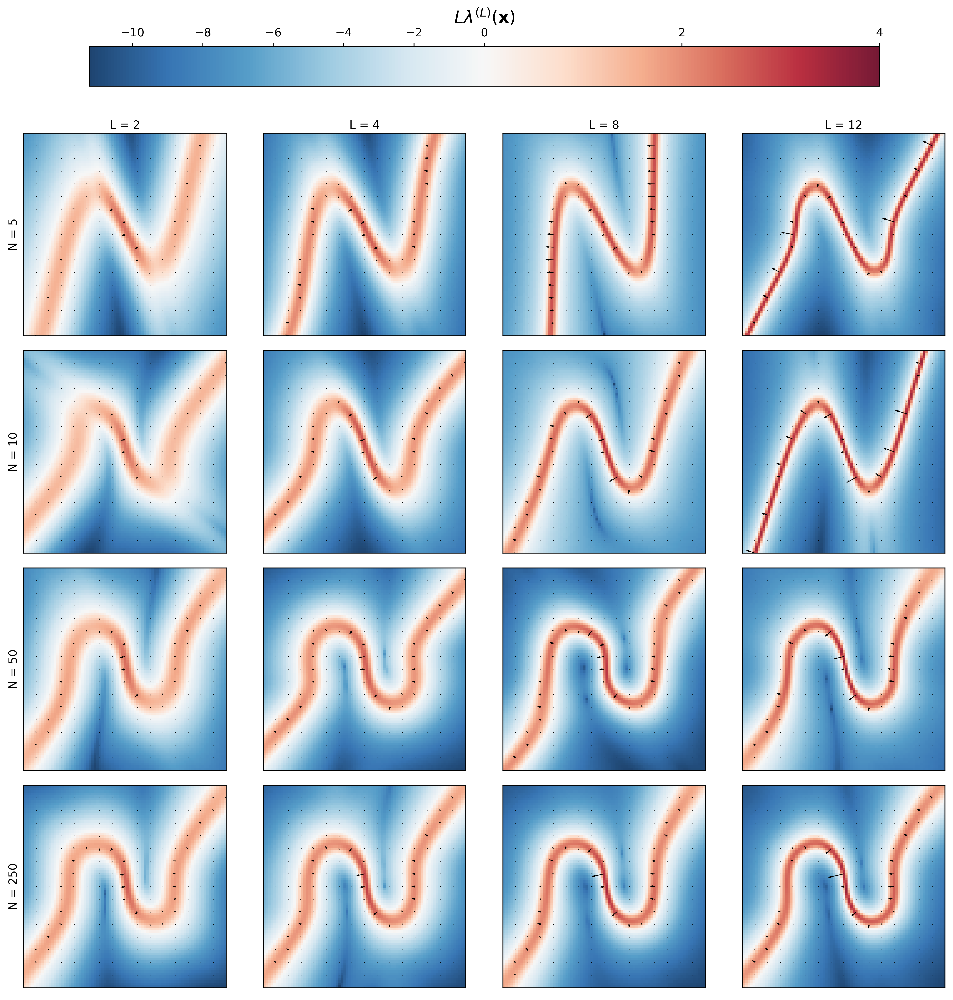

In [377]:
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# Assume scaled_log_singular_values_list and vector_fields_list are given
# Each contains 16 elements corresponding to grids
# scaled_log_singular_values_list: List of 2D numpy arrays
# vector_fields_list: List of (vector_field_x, vector_field_y) tuples (2D numpy arrays)


# Create the figure
fig, axes = plt.subplots(4, 4, figsize=(12, 12), dpi=500)
axes = axes.flatten()

# Iterate over each grid
for i, result in enumerate(total_results_moons):
    ax = axes[i]
    lyapunov_exponents = result["FTLEs"]
    x_grid, y_grid = result["grid"]
    x_grid, y_grid = x_grid[::step, ::step], y_grid[::step, ::step]

    vector_field_x, vector_field_y = result["vector_field"]
    vector_field_x, vector_field_y = vector_field_x[::step, ::step], vector_field_y[::step, ::step]
    
    # Plot the heatmap
    im = ax.imshow(lyapunov_exponents,
                   extent=(-2, 2, -2, 2),
                   origin='lower',
                   cmap='RdBu_r',
                   alpha=0.9,
                   norm=TwoSlopeNorm(vcenter=0, vmax=4))
    
    # Add vector field
    ax.quiver(
        x_grid, y_grid,  # Downsample the grid for clearer arrows
        vector_field_x, vector_field_y, 
        color='black',
        # width=0.004,
        scale=400
        # headlength=0,
        # headaxislength=0
    )
    
    # Title and axis settings
    if i in range(4):
        ax.set_xlabel(f"L = {ell_list[i]}")
        ax.xaxis.set_label_position('top') 
    if not i % 4:
        ax.set_ylabel(f"N = {n_list[i//4]}")
    ax.set_xticks([])
    ax.set_yticks([])

# Add a colorbar to the right of the figure

plt.subplots_adjust(wspace=0.4, hspace=0.4)
plt.tight_layout()
cbar = fig.colorbar(im, ax=axes.ravel().tolist(),
                    orientation='horizontal',
                    location='top',
                    fraction=0.042, pad=0.05)
cbar.set_label(r"$L\lambda^{(L)}(\mathbf{x})$",fontsize=15)
# cbar.ax.xaxis.set_label_position('top')
# cbar.ax.xaxis.tick_top()
plt.show()


In [564]:
net_moons = moons_networks["NET_1"]["network"]

In [480]:
moon_results = make_fields(net_moons, [-2,2], [-2,2], scale_svectors=True)


100%|██████████| 6561/6561 [00:23<00:00, 279.47it/s]


In [ ]:
lyapunov_exponents_moons = moon_results["FTLEs"]
x_grid_moons, y_grid_moons = moon_results["grid"]
vector_field_x_moons, vector_field_y_moons = moon_results["vector_field"]

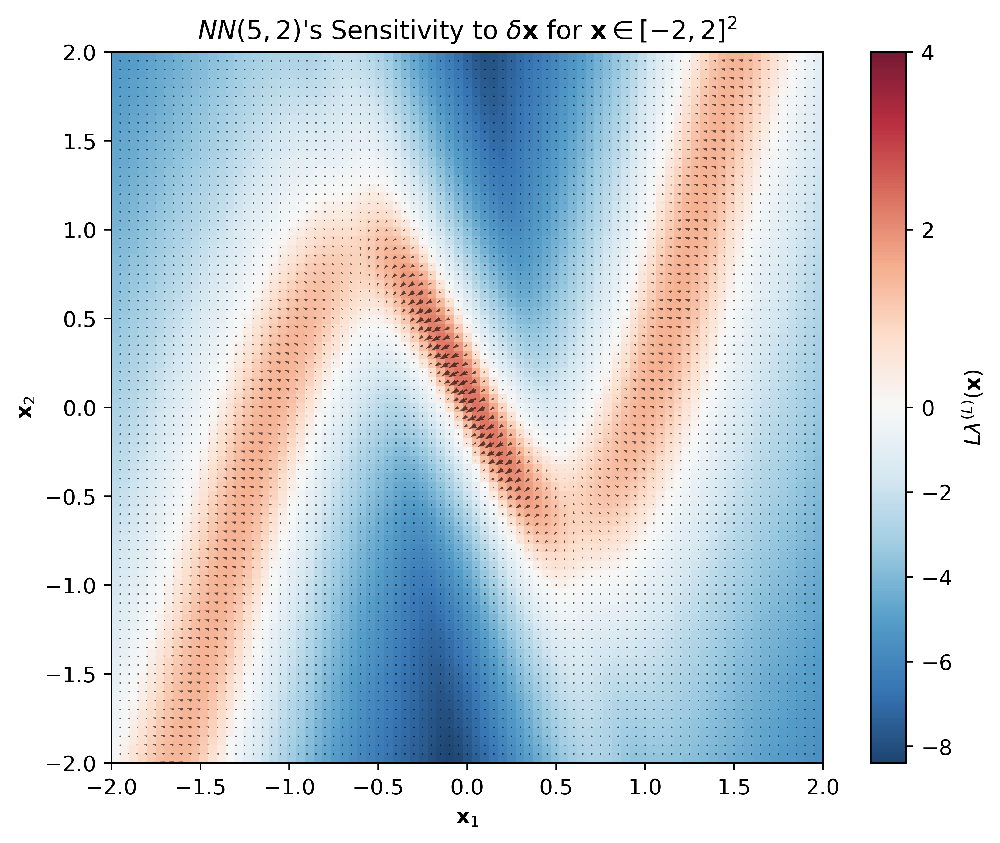

In [ ]:

# y_test_pred = net_1.predict(X_test)
# y_test_pred_rounded = torch.where(y_test_pred >= 0, 1, -1)  # Round to -1 or 1

# Convert data to numpy for matplotlib
# X_test_np = X_test.cpu().numpy()  # Shape: (num_points, 2)
# y_test_pred_rounded_np = y_test_pred_rounded.cpu().numpy().flatten()  # Shape: (num_points,)
# y_test_np = y_test.cpu().numpy().flatten()
# Create a colormap for the classes
# colors = np.where(y_test_np == 1, '#14bdc9', 'black')
# alphas = np.where(y_test_np == 1, 1.0, 0.5)

# Scatter plot
plt.figure(figsize=(8, 6), dpi=500)
# plt.scatter(X_test_np[:, 0], X_test_np[:, 1], c=colors, alpha=alphas, edgecolor='k', s=40)

plt.imshow(lyapunov_exponents_moons,
           extent=(-2, 2, -2, 2),
           origin='lower',
           cmap='RdBu_r',
           alpha=0.9,
           norm=TwoSlopeNorm(vcenter=0, vmax=4))
cbar = plt.colorbar()
cbar.set_label("$L\lambda^{(L)}(\mathbf{x})$")

# plt.streamplot(
#     x_grid_moons.T.numpy(), y_grid_moons.T.numpy(),  # Downsample the grid for clearer arrows
#     vector_field_x_moons.T, vector_field_y_moons.T, 
#     color='black',
#     density=2,
#     linewidth=0.8,
#     # headlength=0,
#     # headaxislength=0
# )

plt.quiver(
    x_grid_moons, y_grid_moons,  # Downsample the grid for clearer arrows
    vector_field_x_moons, vector_field_y_moons, 
    color='black',
    scale=650,
    alpha=0.6
    # headlength=0,
    # headaxislength=0
)



plt.title(f"$NN({net_moons.layers[1].out_features}, {len(net_moons.layers)-2})$'s "+r"Sensitivity to $ \delta \mathbf{x}$ for $\mathbf{x}\in [-2, 2]^2$")
plt.xlabel("$\mathbf{x}_1$")
plt.ylabel("$\mathbf{x}_2$")
# plt.grid(True)
plt.show()


In [481]:
y_moons_train_pred = net_moons.predict(X_train_moons)

In [447]:
def make_torch_moons(n_samples=1000, noise=0.1, random_state=42):
    # Parameters for the dataset
    n_samples = 4000
    noise = 0.1  # Adjust for desired overlap between classes

    # Generate the dataset using sklearn
    X, y = make_moons(n_samples=n_samples, noise=noise, random_state=42)

    # Find the min and max values of X
    X_min = X.min(axis=0)
    X_max = X.max(axis=0)

    # Scale X to the range [-2, 2]
    X_scaled = 4 * (X - X_min) / (X_max - X_min) - 2

    # Convert to PyTorch tensors
    X_tensor = torch.tensor(X_scaled, dtype=torch.float32).to(DEVICE)  # Features
    y_tensor = (torch.tensor(y, dtype=torch.float32).reshape(-1,1) * 2. - 1.).to(DEVICE)         # Labels
    return X_tensor, y_tensor

In [471]:
X_example, y_example = make_torch_moons(n_samples=2000)

In [482]:
y_example_pred = net_moons.predict(X_example)

In [483]:
y_example_pred_rounded = torch.where(y_example_pred >= 0., 1., -1.)

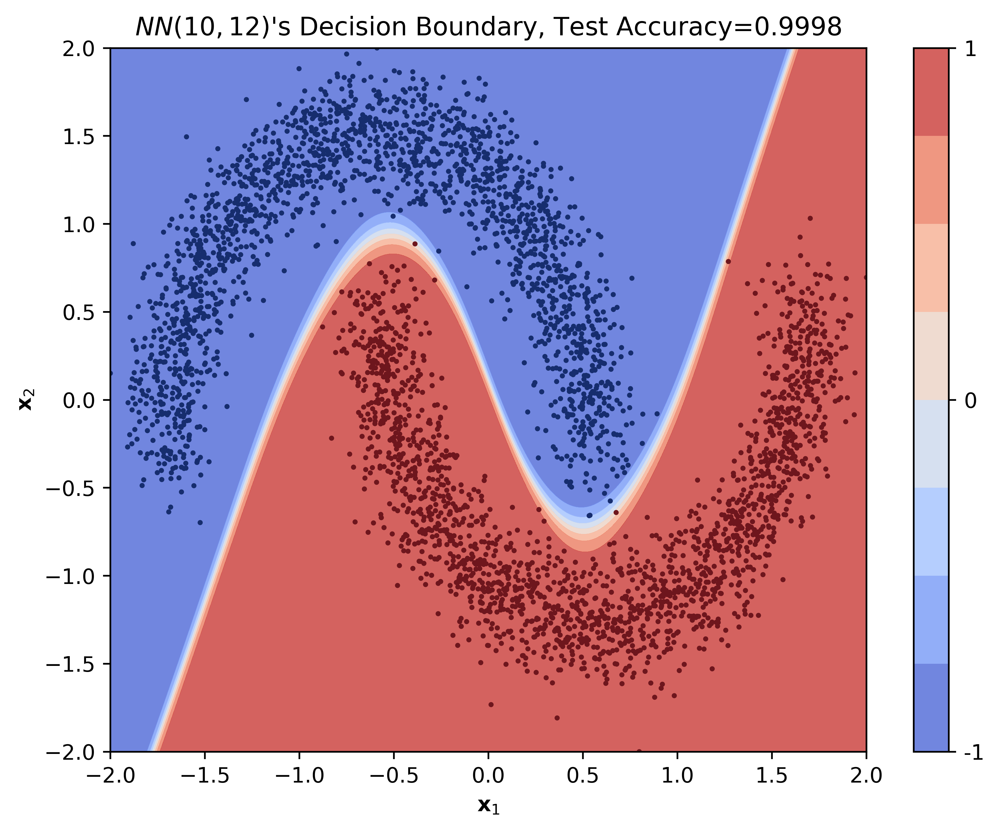

In [484]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import matplotlib.ticker as mticker

# Assuming `net` is your trained model

# Step 1: Create a grid of points in [-2, 2]^2
x_min, x_max = -2, 2
y_min, y_max = -2, 2
resolution = 1000  # Number of points per axis for the grid
x_vals = np.linspace(x_min, x_max, resolution)
y_vals = np.linspace(y_min, y_max, resolution)
xx, yy = np.meshgrid(x_vals, y_vals)

# Flatten the grid to feed into the model
grid_points = np.c_[xx.ravel(), yy.ravel()]
grid_tensor = torch.tensor(grid_points, dtype=torch.float32).to(DEVICE)

# Step 2: Predict on the grid points
with torch.no_grad():
    predictions = net_moons.predict(grid_tensor)  # Shape: (num_points, 1 or 2 depending on model)
    # if predictions.shape[1] > 1:  # For CrossEntropyLoss-style output with logits
    #     predictions = torch.argmax(predictions, dim=1).cpu().numpy()
    # else:  # For BCEWithLogitsLoss-style output
    #     predictions = (torch.sigmoid(predictions).cpu().numpy().flatten() > 0.5).astype(int)

# Reshape predictions to match the grid
decision_map = predictions.cpu().numpy().flatten().reshape(xx.shape)

# Step 3: Plot the decision boundary
plt.figure(figsize=(8, 6), dpi=500)
plt.contourf(xx, yy, decision_map, alpha=0.8, cmap="coolwarm")
cbar = plt.colorbar(ticks=[-1, 0, 1],
                    format=mticker.FixedFormatter(['-1', '0', '1']))

colors = np.where(y_example_pred_rounded.cpu().numpy().flatten() == 1, '#6e161d', '#162d6e')
plt.scatter(X_example[:,0].cpu(), X_example[:,1].cpu(), color=colors, s=2)

# plt.streamplot(
#     x_grid_moons.T.numpy(), y_grid_moons.T.numpy(),  # Downsample the grid for clearer arrows
#     vector_field_x_moons.T, vector_field_y_moons.T, 
#     color='black',
#     density=2,
#     linewidth=0.8,
#     # headlength=0,
#     # headaxislength=0
# )


plt.title(f"$NN({net_moons.layers[1].out_features}, {len(net_moons.layers)-2})$'s Decision Boundary" + f", Test Accuracy={round(accuracy_fn(y_example_pred, y_example).item(), 4)}")
plt.xlabel("$\mathbf{x}_1$")
plt.ylabel("$\mathbf{x}_2$")
# Optional: Add training points for visualization
# Assuming `X_train` and `y_train` are your training data
# plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolor="k", cmap="coolwarm")

plt.show()


Back to Circles

In [485]:
torch.manual_seed(312)
X_circles = (torch.rand(2000, 2) * 4 - 2).to(DEVICE)
y_circles = (torch.where(X_circles[:, 0]**2 + X_circles[:, 1]**2 < 1, 1., -1.)).reshape(-1, 1).to(DEVICE)

In [581]:
net_circles = networks["NET_1"]["network"]

In [507]:
y_circles_pred = net_circles.predict(X_circles)
y_circles_pred_rounded = torch.where(y_circles_pred>=0., 1., -1.)

In [522]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import matplotlib.ticker as mticker


# Step 2: Predict on the grid points
with torch.no_grad():
    predictions_circles = net_circles.predict(grid_tensor)  # Shape: (num_points, 1 or 2 depending on model)
    # if predictions.shape[1] > 1:  # For CrossEntropyLoss-style output with logits
    #     predictions = torch.argmax(predictions, dim=1).cpu().numpy()
    # else:  # For BCEWithLogitsLoss-style output
    #     predictions = (torch.sigmoid(predictions).cpu().numpy().flatten() > 0.5).astype(int)

# Reshape predictions to match the grid
decision_map_circles = predictions_circles.cpu().numpy().flatten().reshape(xx.shape)

# Step 3: Plot the decision boundary
plt.figure(figsize=(8, 6), dpi=500)
plt.contourf(xx, yy, decision_map_circles, alpha=0.8, cmap="coolwarm")
cbar = plt.colorbar(ticks=[-1, 0, 1],
                    format=mticker.FixedFormatter(['-1', '0', '1']))

colors = np.where(y_circles_pred_rounded.cpu().numpy().flatten() == 1, '#6e161d', '#162d6e')
plt.scatter(X_circles[:,0].cpu(), X_circles[:,1].cpu(), color=colors, s=5)

# plt.streamplot(
#     x_grid_moons.T.numpy(), y_grid_moons.T.numpy(),  # Downsample the grid for clearer arrows
#     vector_field_x_moons.T, vector_field_y_moons.T, 
#     color='black',
#     density=2,
#     linewidth=0.8,
#     # headlength=0,
#     # headaxislength=0
# )
theta = np.linspace(0, 2*np.pi, 100)
x = np.cos(theta)
y = np.sin(theta)
plt.plot(x,y, color='black', linestyle='--',alpha=0.7)

plt.title(f"$NN({net_circles.layers[1].out_features}, {len(net_circles.layers)-2})$'s Decision Boundary" + f", Test Accuracy={round(accuracy_fn(y_circles_pred, y_circles).item(), 4)}")
plt.xlabel("$\mathbf{x}_1$")
plt.ylabel("$\mathbf{x}_2$")
# Optional: Add training points for visualization
# Assuming `X_train` and `y_train` are your training data
# plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, edgecolor="k", cmap="coolwarm")

# plt.show()
plt.savefig("./net_images/images_network_1/sample_image.png", bbox_inches='tight')
plt.close()


In [553]:
def make_jacobian_sequence_fields(net, x_range, y_range, grid_step=0.05, scale_exponent=False, scale_svectors=False, 
                                  vector_step=None, compute_fields=False, cuda=False):
    """
    Parameters:
    - net: a trained CustomNetwork instance
    - x_range: List[x_min, x_max]
    - y_range: List[y_min, y_max]
    - grid_step: step size of the resulting grid
    - scale_exponent: if True, scales the Lyapunov exponent by the number of layers
    - scale_svectors: if True, scales singular vectors by their corresponding singular values
    - vector_step: (k) int, print every k'th vector in each row
    - compute_fields: if False, skips computation of vector fields
    - cuda: if True, moves tensors to GPU
    """
    x_values = torch.arange(x_range[0], x_range[1] + grid_step, grid_step).to(DEVICE)  # Range for x-axis
    y_values = torch.arange(y_range[0], y_range[1] + grid_step, grid_step).to(DEVICE)  # Range for y-axis

    # Generate the grid
    x_grid, y_grid = torch.meshgrid(x_values, y_values, indexing='ij')
    grid_points = torch.stack([x_grid.flatten(), y_grid.flatten()], dim=1)  # Combine coordinates into grid points

    # Step 2: Compute singular vectors and scaled singular values for each layer
    L = len(net.layers)  # Number of layers in the network excluding input & output
    results = []

    for l in range(L):  # For each layer, compute Lyapunov fields
        scaled_log_singular_values = []
        vector_field_x = []
        vector_field_y = []

        for point in tqdm(grid_points, desc=f"Layer {l + 1}/{L}"):
            point = point.unsqueeze(0)  # Add batch dimension
            jacobian_sequence = net.compute_jacobian_sequence(point, return_total_jacobians=True)  # Layer-to-layer Jacobians
            jacobian = jacobian_sequence[l].squeeze(0)  # Shape: (output_dim, input_dim)

            # Perform SVD on the Jacobian
            U, S, Vh = torch.linalg.svd(jacobian, full_matrices=False)
            
            # Extract the first singular vector and scaled singular value
            if compute_fields:
                first_singular_vector = Vh[0] if not scale_svectors else Vh[0] * S[0]
                vector_field_x.append(first_singular_vector[0].item())
                vector_field_y.append(first_singular_vector[1].item())

            scaled_log_singular_value = (torch.log(S[0]) if not scale_exponent else torch.log(S[0]) / L).item()
            scaled_log_singular_values.append(scaled_log_singular_value)

        # Step 3: Reshape results for visualization
        scaled_log_singular_values = torch.tensor(scaled_log_singular_values).view(x_values.size(0), y_values.size(0)).to(DEVICE)
        if compute_fields:
            vector_field_x = torch.tensor(vector_field_x).view(x_values.size(0), y_values.size(0)).to(DEVICE)
            vector_field_y = torch.tensor(vector_field_y).view(x_values.size(0), y_values.size(0)).to(DEVICE)

            # Downsample fields for visualization if `vector_step` is provided
            x_grid_ds, y_grid_ds = x_grid[::vector_step, ::vector_step], y_grid[::vector_step, ::vector_step]
            vector_field_x_ds = vector_field_x[::vector_step, ::vector_step]
            vector_field_y_ds = vector_field_y[::vector_step, ::vector_step]
        else:
            x_grid_ds, y_grid_ds, vector_field_x_ds, vector_field_y_ds = None, None, None, None

        # Append results for this layer
        results.append({
            "FTLEs": scaled_log_singular_values.T if cuda else scaled_log_singular_values.cpu().T,
            "grid": (x_grid_ds, y_grid_ds) if compute_fields and cuda else (x_grid_ds.cpu(), y_grid_ds.cpu()) if compute_fields else None,
            "vector_field": (vector_field_x_ds, vector_field_y_ds) if compute_fields and cuda else (vector_field_x_ds.cpu(), vector_field_y_ds.cpu()) if compute_fields else None
        })

    return results


In [584]:
net_circles = networks["NET_4"]["network"]

In [587]:
jacobian_fields = make_jacobian_sequence_fields(net_circles, [-2, 2], [-2, 2], grid_step=0.075)

Layer 14/14: 100%|██████████| 3025/3025 [03:11<00:00, 15.77it/s]


In [591]:
net_moons = moons_networks["NET_4"]["network"]

In [592]:
jacobian_fields_moons = make_jacobian_sequence_fields(net_moons, [-2, 2], [-2, 2], grid_step=0.075)

Layer 14/14: 100%|██████████| 3025/3025 [02:51<00:00, 17.67it/s]


In [558]:
import os
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

def save_layer_plots(results, net, net_index):
    """
    Generates and saves plots for each layer based on Jacobian-Lyapunov results.

    Parameters:
    - results: List of dictionaries, each containing 'FTLEs', 'grid', and 'vector_field'
    - net: The trained neural network (CustomNet instance)
    - net_index: Index of the network for organizing saved files
    """
    # Create the directory to save plots
    save_dir = f"./net_images/images_network_{net_index}/"
    os.makedirs(save_dir, exist_ok=True)

    for i, layer_results in enumerate(results):
        # Extract data for the current layer
        lyapunov_exponents = layer_results["FTLEs"]
        grid = layer_results["grid"]
        vector_field = layer_results["vector_field"]

        if grid is None or vector_field is None:
            print(f"Skipping vector field plot for layer {i + 1} (compute_fields=False)")
            continue
        
        # x_grid, y_grid = grid
        # vector_field_x, vector_field_y = vector_field

        # Create the plot
        plt.figure(figsize=(8, 6), dpi=500)
        
        # Lyapunov Exponents Heatmap
        plt.imshow(
            lyapunov_exponents,
            extent=(-2, 2, -2, 2),
            origin='lower',
            cmap='RdBu_r',
            alpha=0.9,
            norm=TwoSlopeNorm(vcenter=0, vmax=4)
        )

        # Colorbar
        cbar = plt.colorbar()
        cbar.set_label(r"$L\lambda^{(L)}(\mathbf{x})$")
        
        # Quiver Plot for Singular Vectors
        # plt.quiver(
        #     x_grid, y_grid,  # Grid points
        #     vector_field_x, vector_field_y,  # Vector field
        #     color='black',
        #     scale=650,
        #     alpha=0.6
        # )

        # Title and Labels
        plt.title(f"$NN({net.layers[1].out_features}, {len(net.layers)-2})$'s "+r"Sensitivity to $ \delta \mathbf{x}$ for $\mathbf{x}\in [-2, 2]^2$")
        plt.xlabel(r"$\mathbf{x}_1$")
        plt.ylabel(r"$\mathbf{x}_2$")
        
        # # Save the plot
        # save_path = save_dir + f"layer_{i}.png"
        # plt.savefig(save_path, bbox_inches='tight')
        # plt.close()  # Close the figure to save memory
        plt.show()


        print(f"Saved plot for layer {i + 1} at: {save_path}")


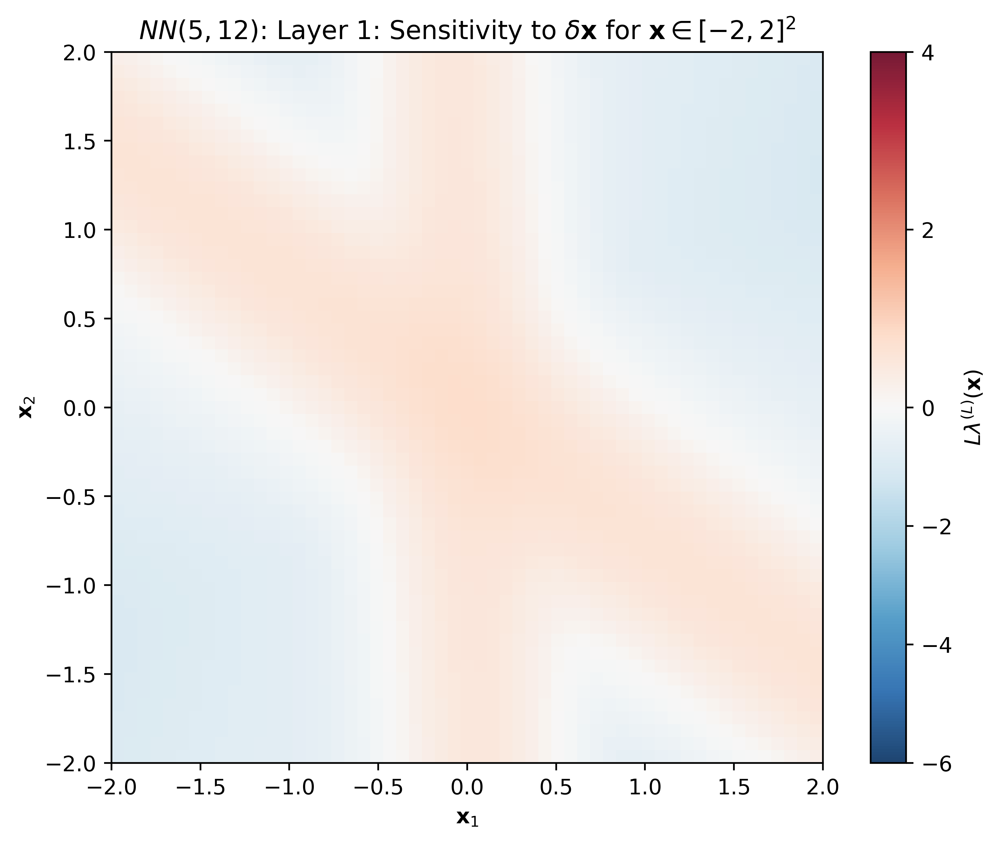

Saved plot for layer 1 at: net_images/moons_network_5-12/layer_1.png


<Figure size 640x480 with 0 Axes>

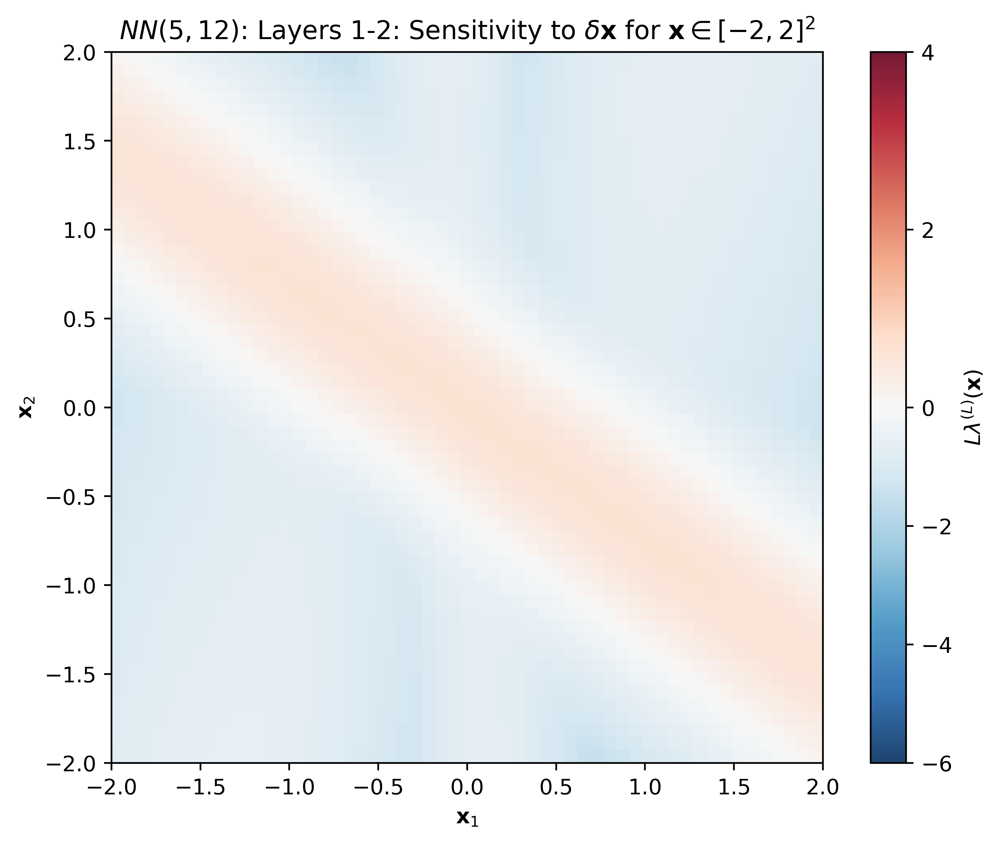

Saved plot for layer 2 at: net_images/moons_network_5-12/layer_2.png


<Figure size 640x480 with 0 Axes>

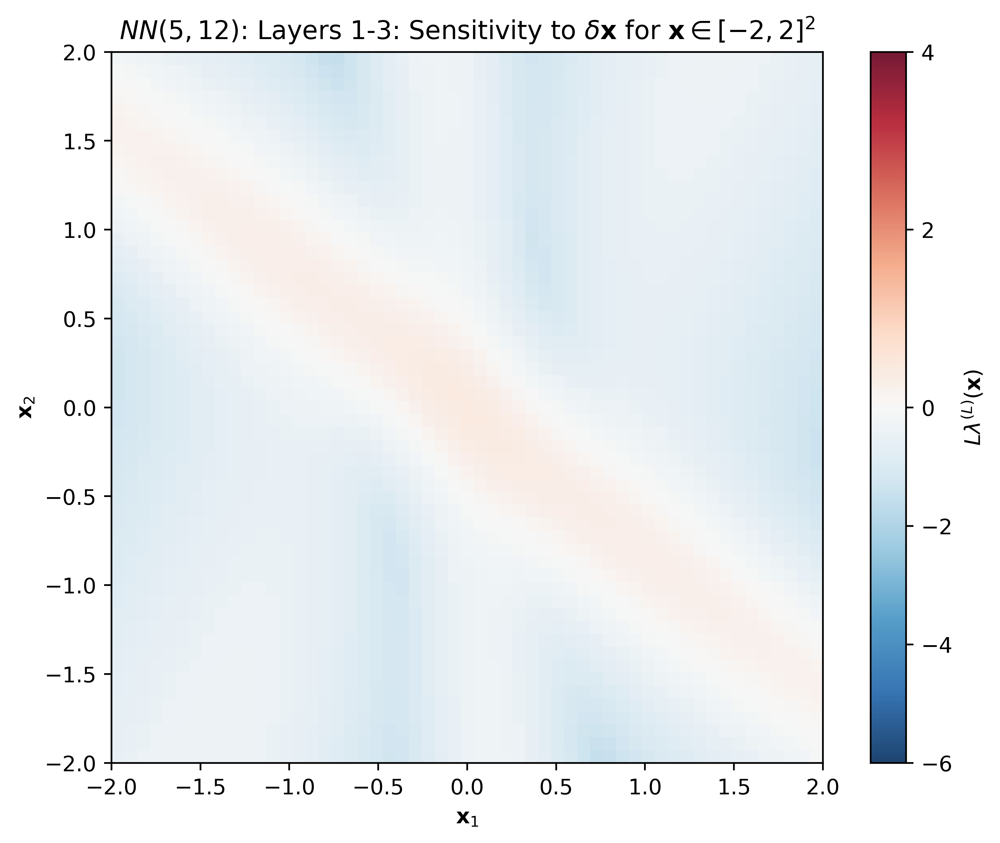

Saved plot for layer 3 at: net_images/moons_network_5-12/layer_3.png


<Figure size 640x480 with 0 Axes>

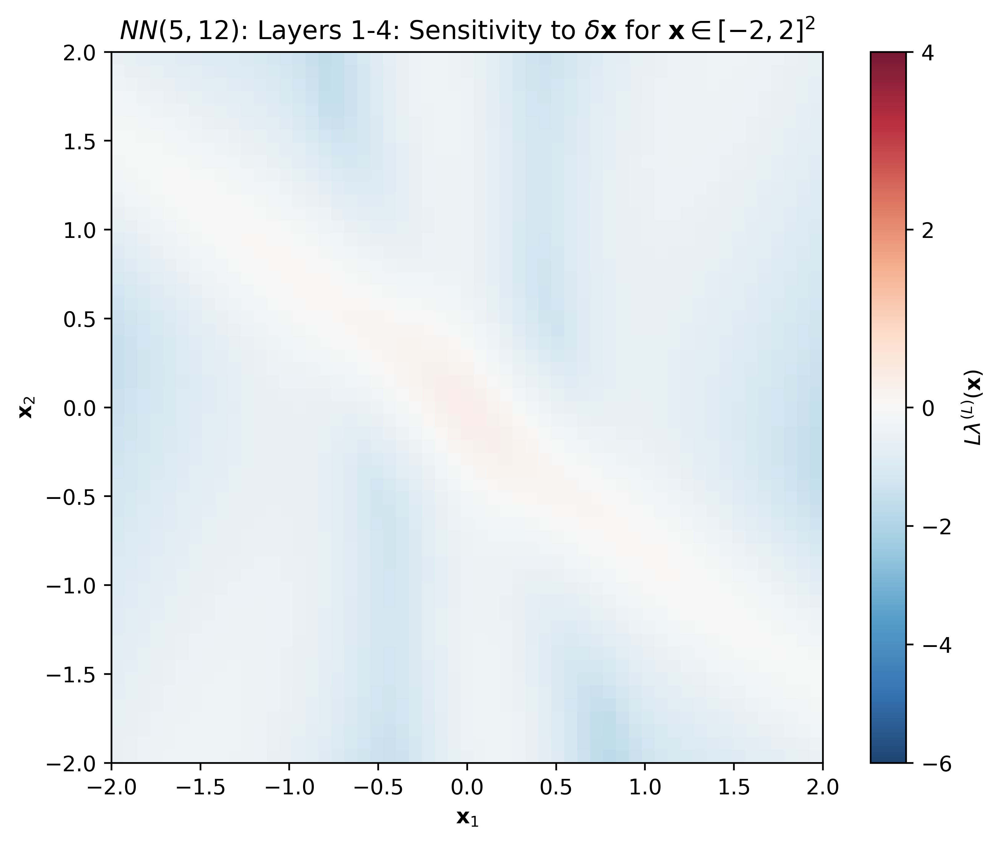

Saved plot for layer 4 at: net_images/moons_network_5-12/layer_4.png


<Figure size 640x480 with 0 Axes>

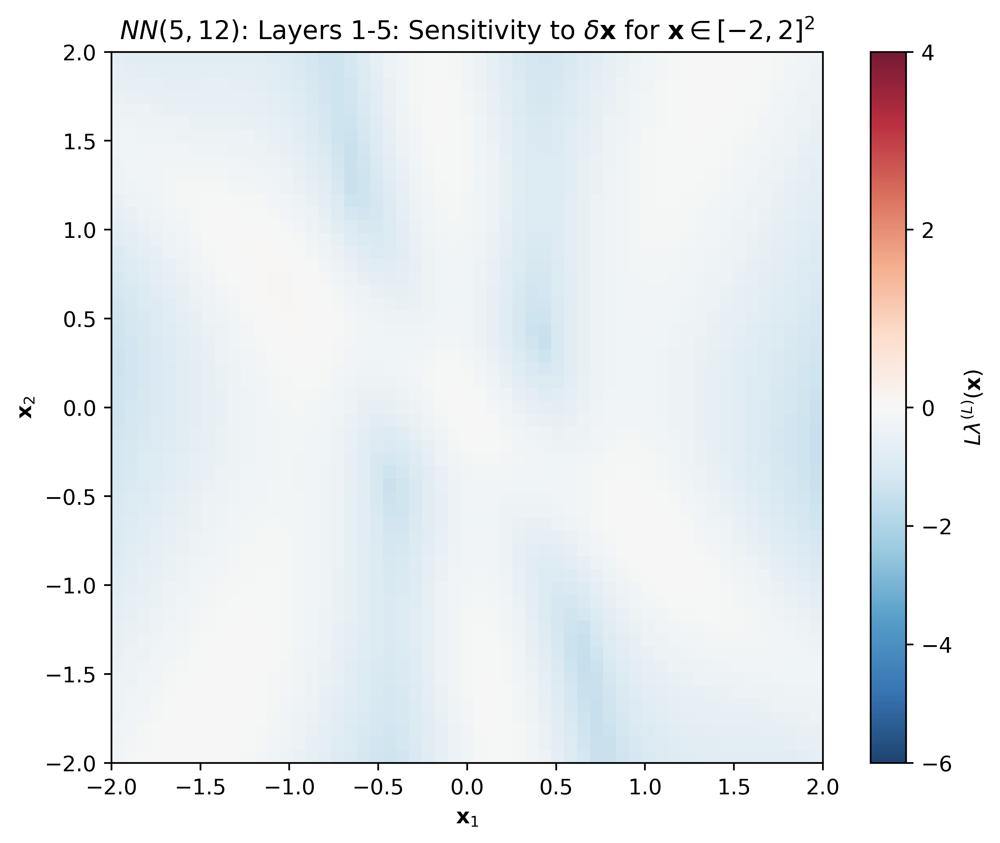

Saved plot for layer 5 at: net_images/moons_network_5-12/layer_5.png


<Figure size 640x480 with 0 Axes>

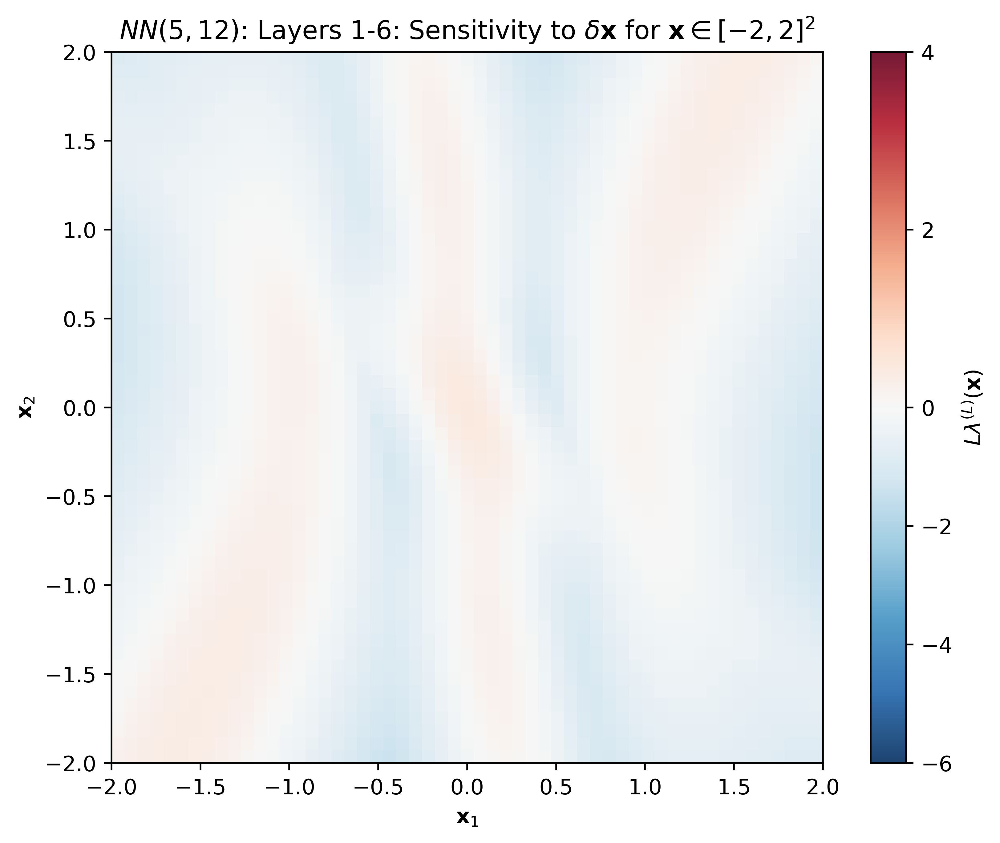

Saved plot for layer 6 at: net_images/moons_network_5-12/layer_6.png


<Figure size 640x480 with 0 Axes>

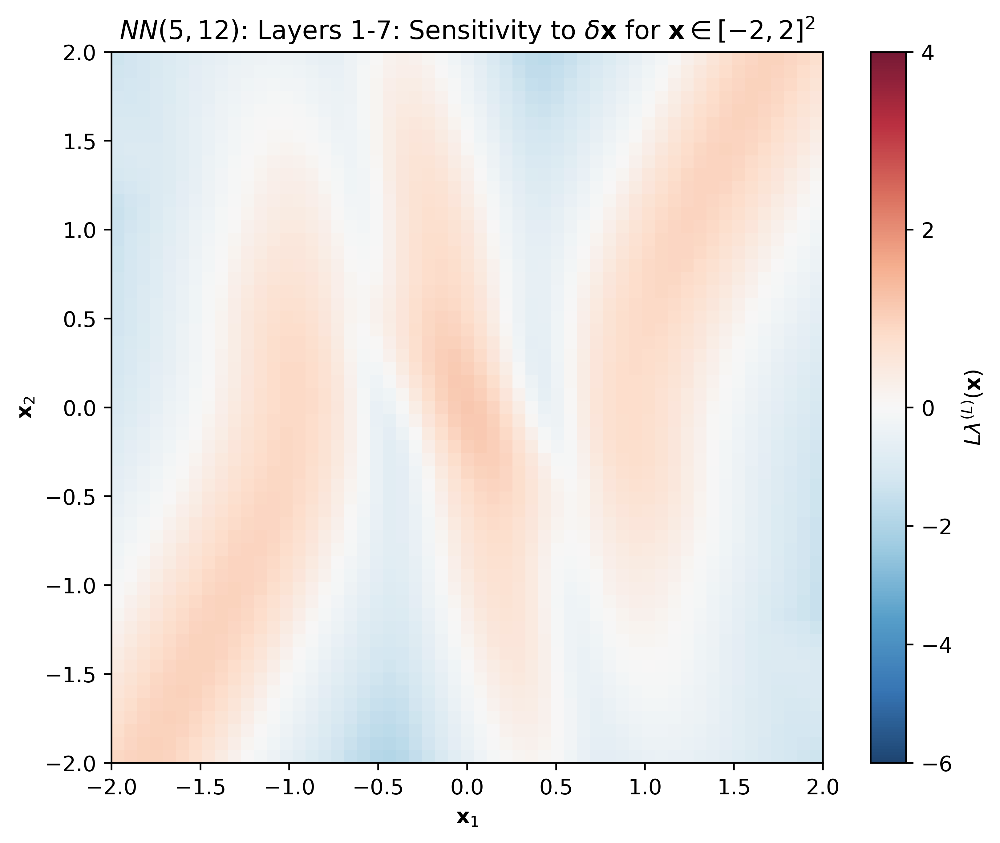

Saved plot for layer 7 at: net_images/moons_network_5-12/layer_7.png


<Figure size 640x480 with 0 Axes>

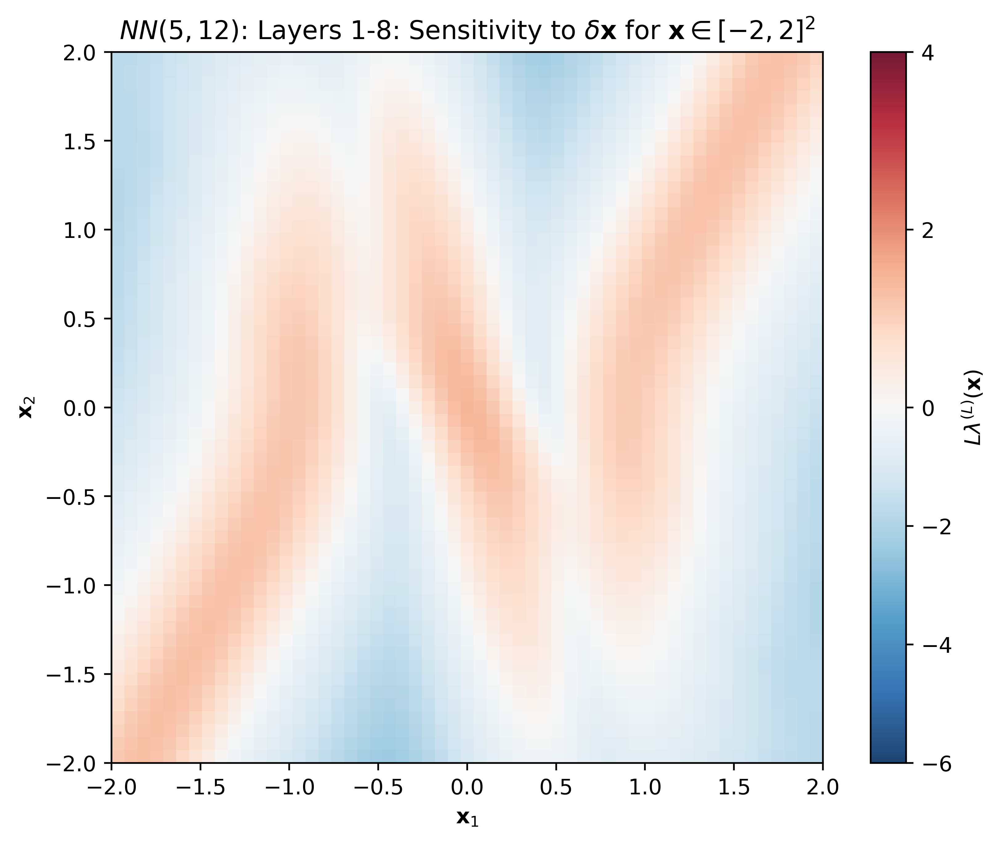

Saved plot for layer 8 at: net_images/moons_network_5-12/layer_8.png


<Figure size 640x480 with 0 Axes>

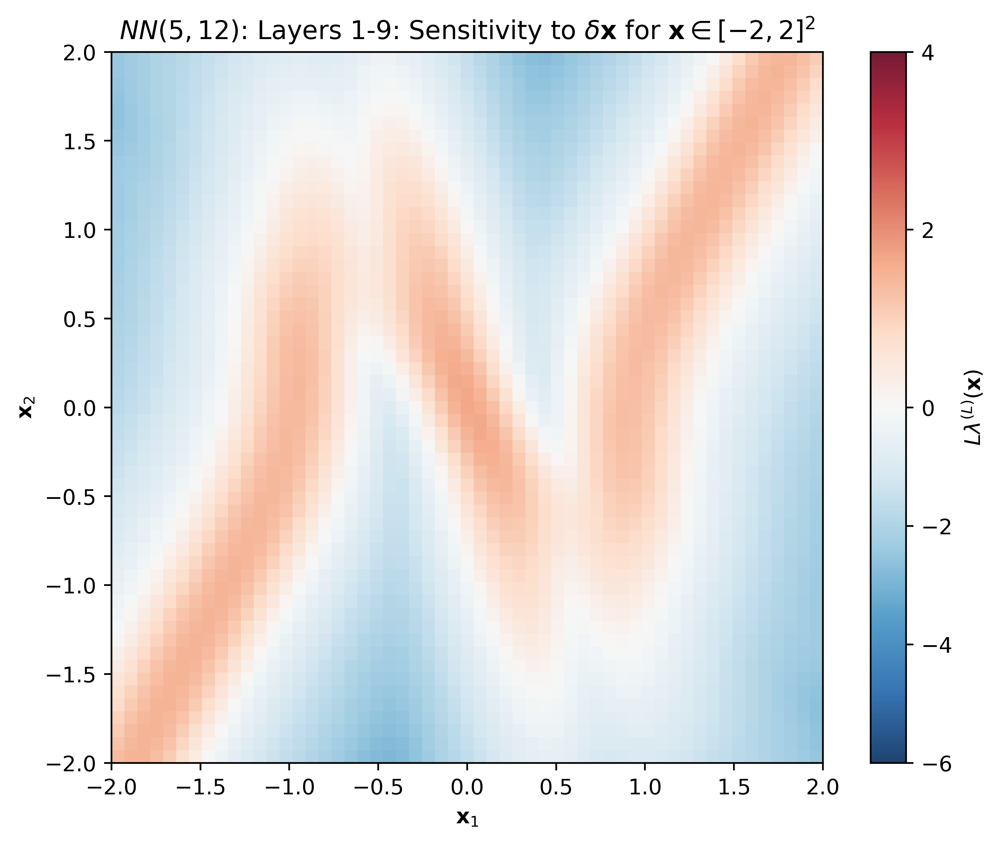

Saved plot for layer 9 at: net_images/moons_network_5-12/layer_9.png


<Figure size 640x480 with 0 Axes>

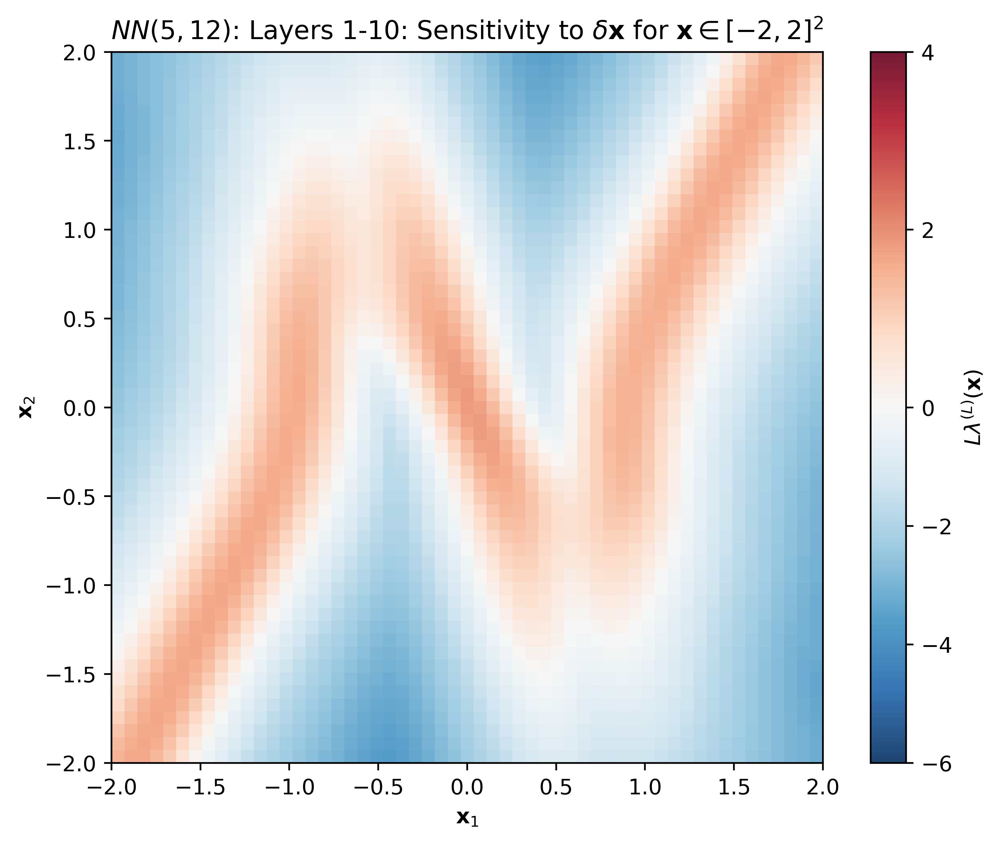

Saved plot for layer 10 at: net_images/moons_network_5-12/layer_10.png


<Figure size 640x480 with 0 Axes>

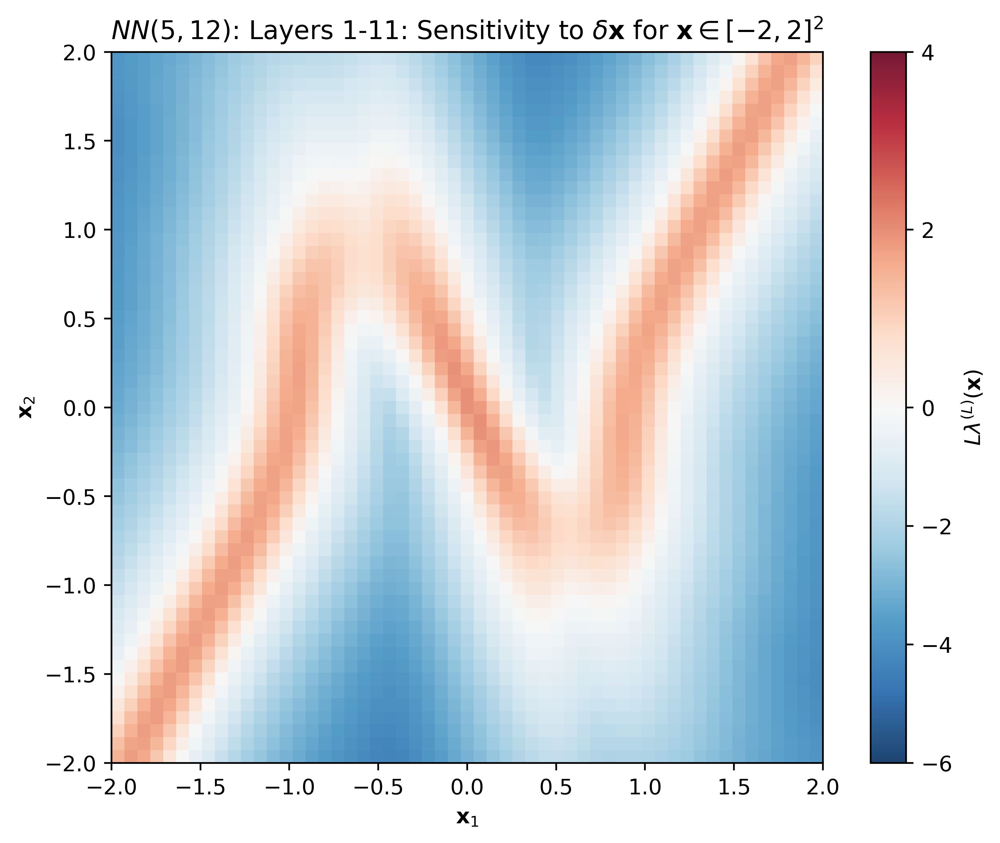

Saved plot for layer 11 at: net_images/moons_network_5-12/layer_11.png


<Figure size 640x480 with 0 Axes>

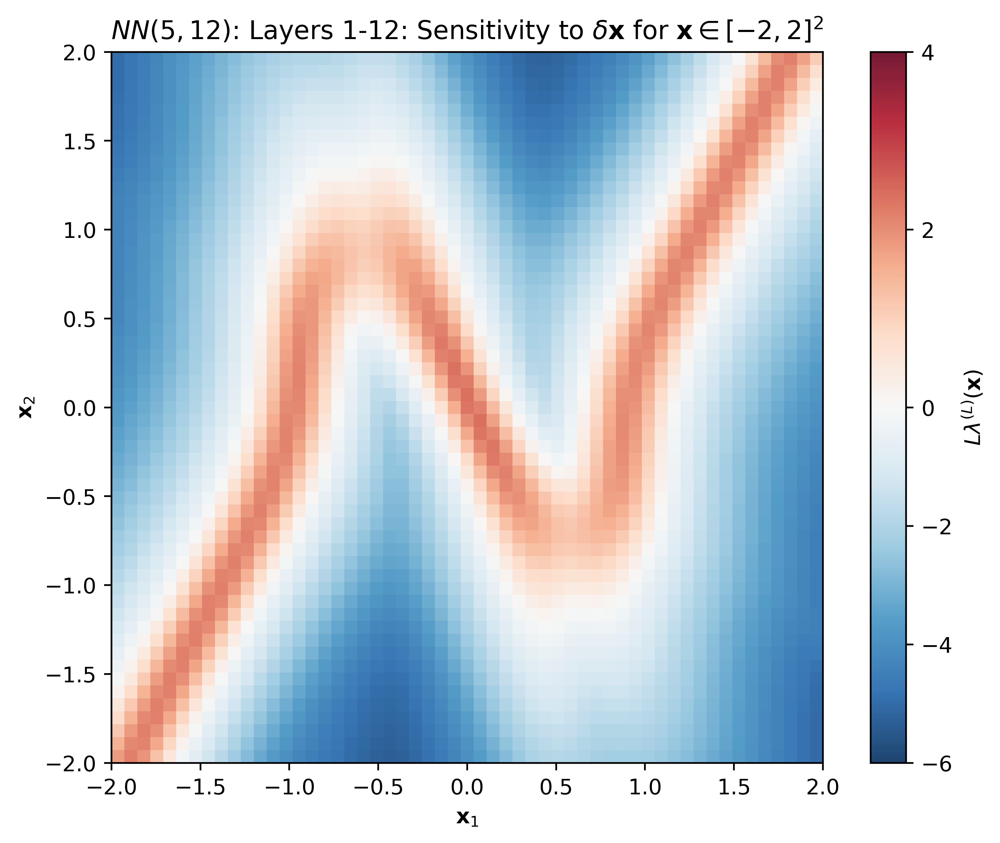

Saved plot for layer 12 at: net_images/moons_network_5-12/layer_12.png


<Figure size 640x480 with 0 Axes>

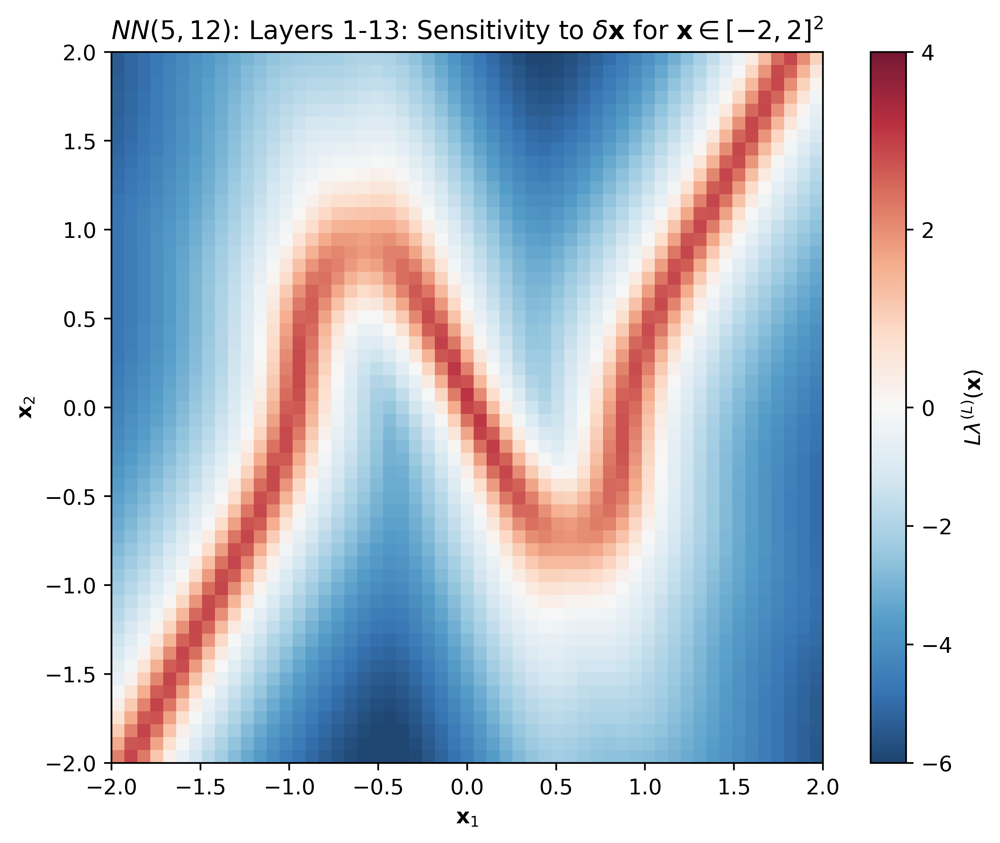

Saved plot for layer 13 at: net_images/moons_network_5-12/layer_13.png


<Figure size 640x480 with 0 Axes>

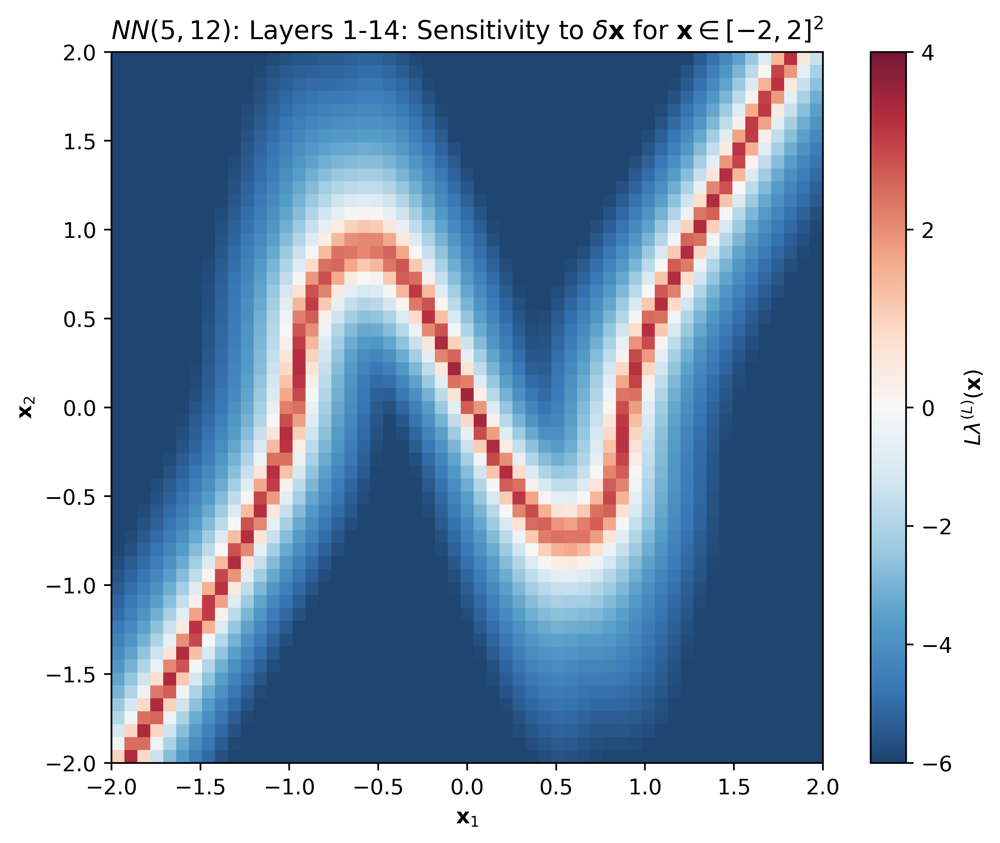

Saved plot for layer 14 at: net_images/moons_network_5-12/layer_14.png


<Figure size 640x480 with 0 Axes>

In [593]:
save_dir = "net_images/moons_network_5-12/"
for i, layer_results in enumerate(jacobian_fields_moons):
    # Extract data for the current layer
    lyapunov_exponents = layer_results["FTLEs"]
    # x_grid, y_grid = grid
    # vector_field_x, vector_field_y = vector_field

    # Create the plot
    plt.figure(figsize=(8, 6), dpi=500)
    
    # Lyapunov Exponents Heatmap
    plt.imshow(
        lyapunov_exponents,
        extent=(-2, 2, -2, 2),
        origin='lower',
        cmap='RdBu_r',
        alpha=0.9,
        norm=TwoSlopeNorm(vmin=-6, vcenter=0, vmax=4)
    )

    # Colorbar
    cbar = plt.colorbar()
    cbar.set_label(r"$L\lambda^{(L)}(\mathbf{x})$")
    
    # Quiver Plot for Singular Vectors
    # plt.quiver(
    #     x_grid, y_grid,  # Grid points
    #     vector_field_x, vector_field_y,  # Vector field
    #     color='black',
    #     scale=650,
    #     alpha=0.6
    # )

    # Title and Labels
    plt.title(f"$NN({net_moons.layers[1].out_features}, {len(net_moons.layers)-2})$: Layer{'s' if i>0 else ''} 1{'-' if i>0 else ''}{i+1 if i>0 else ''}: "+r"Sensitivity to $ \delta \mathbf{x}$ for $\mathbf{x}\in [-2, 2]^2$")
    plt.xlabel(r"$\mathbf{x}_1$")
    plt.ylabel(r"$\mathbf{x}_2$")
    fig_cur = plt.gcf()
    plt.show()
    plt.draw()
    # Save the plot
    save_path = save_dir + f"layer_{i+1}.png"
    fig_cur.savefig(save_path, bbox_inches='tight')
    # plt.close()  # Close the figure to save memory
    # plt.show()

    print(f"Saved plot for layer {i + 1} at: {save_path}")

The initialization proposed in the paper helps mitigate the **vanishing gradient problem** by controlling the variance of the activations and gradients as they propagate through the network. Here's a detailed explanation:

---

### 1. **Vanishing Gradient Problem Recap**
The vanishing gradient problem occurs when:
- Gradients shrink exponentially as they are propagated backward through layers in a deep network.
- This often happens when the activations or weights in earlier layers become too small.

This problem is particularly severe when:
- Using activation functions like `sigmoid` or `tanh` that saturate for large or small input values.
- Improper initialization of weights leads to extremely small activations or gradients.

---

### 2. **How Initialization Affects Gradient Flow**
The variance of activations and gradients depends on the initialization of weights. Improper initialization can cause:
- **Exploding gradients** if the variance of weights is too large.
- **Vanishing gradients** if the variance of weights is too small.

---

### 3. **Variance Stabilization with $\sigma_w^2 \sim \frac{1}{N}$**
In the paper's proposed initialization:
- **Weights are initialized with $\mathcal{N}(0, \sigma_w^2)$, where $\sigma_w^2 = \frac{1}{N}$:**
  - $N$ is the number of inputs to the layer (fan-in).
  - This ensures that the variance of activations and gradients is stabilized across layers.

#### **Forward Pass: Variance of Activations**
- Consider a single layer with inputs $x$, weights $w$, and activations $a = w^T x$:
  - If $x$ has variance $\text{Var}[x] = \sigma_x^2$ and $w$ is initialized with $\text{Var}[w] = \frac{1}{N}$, then:
    $$
    \text{Var}[a] = \text{Var}[w^T x] = N \cdot \text{Var}[w] \cdot \text{Var}[x] = N \cdot \frac{1}{N} \cdot \sigma_x^2 = \sigma_x^2
    $$
  - The variance of activations remains constant across layers, preventing them from shrinking or growing exponentially.

#### **Backward Pass: Variance of Gradients**
- During backpropagation, gradients also flow through the weights:
  - If weights are initialized with $\text{Var}[w] = \frac{1}{N}$, the variance of gradients remains stable:
    $$
    \text{Var}[\nabla w] \propto \frac{1}{N} \cdot \text{Var}[\nabla a]
    $$
  - This prevents gradients from vanishing as they propagate backward.

---

### 4. **Why $\frac{1}{N}$ is Optimal**
The choice of $\frac{1}{N}$ comes from balancing the variance of activations and gradients:
- Smaller variances ($\ll \frac{1}{N}$) would lead to vanishing gradients.
- Larger variances ($> \frac{1}{N}$) would lead to exploding gradients.

This initialization is closely related to **Xavier Initialization**, which uses $\sigma^2 = \frac{2}{\text{fan\_in} + \text{fan\_out}}$, and is effective for activation functions like `tanh`.

---

### 5. **Comparison with Other Initialization Methods**
| Initialization           | Variance of Weights         | Applicability                                    |
|---------------------------|-----------------------------|-------------------------------------------------|
| **Paper's Method**        | $\sigma_w^2 = \frac{1}{N}$ | Works well for deep networks with `tanh` or `sigmoid`. |
| **Xavier Initialization** | $\sigma_w^2 = \frac{1}{\text{fan\_in} + \text{fan\_out}}$ | Good for balanced variance in both directions.  |
| **He Initialization**     | $\sigma_w^2 = \frac{2}{\text{fan\_in}}$ | Designed for `ReLU` or its variants.           |

---

### 6. **Practical Benefits**
- **Stabilized Activations**: Prevents activations from becoming too small or large, ensuring effective forward propagation.
- **Consistent Gradients**: Prevents gradients from vanishing, enabling effective backpropagation even in deep networks.
- **Improved Convergence**: Reduces the number of epochs required to train the model.

---

### Summary
The initialization ensures that the variance of activations and gradients remains consistent across layers by scaling the weights based on the number of inputs ($N$) to each layer. This prevents vanishing gradients and makes training deep networks feasible, particularly when using activation functions like `tanh` or `sigmoid`.

## NEW

### Lyapunov Exponent

The **Lyapunov exponent** is a measure used in dynamical systems to quantify the rate of separation of infinitesimally close trajectories. It is an important concept in the study of chaos and stability in both continuous and discrete dynamical systems. Specifically:

- It describes how small perturbations or differences between trajectories grow (or shrink) exponentially over time.
- A positive Lyapunov exponent indicates **sensitivity to initial conditions**, a hallmark of chaos.
- A negative Lyapunov exponent signifies convergence of nearby trajectories, leading to stability.
- Zero Lyapunov exponent implies neutral behavior, such as on the boundary between chaotic and stable dynamics.

For a system with $ n $ degrees of freedom, there are $ n $ Lyapunov exponents. The largest Lyapunov exponent ($ \lambda_{\text{max}} $) is often used to assess the overall nature of the system:
$$
\lambda = \lim_{t \to \infty} \frac{1}{t} \ln \frac{\| \delta X(t) \|}{\| \delta X(0) \|}
$$
where:
- $ \delta X(t) $ is the separation vector between two nearby trajectories at time $ t $,
- $ \| \cdot \| $ denotes a norm (e.g., Euclidean norm).

### Finite-Time Lyapunov Exponent (FTLE)

The **Finite-Time Lyapunov Exponent (FTLE)** is a localized, time-dependent version of the Lyapunov exponent. It measures the average rate of divergence or convergence of trajectories over a finite time horizon. This is particularly useful for systems where the dynamics vary over time, such as non-autonomous or time-dependent systems.

The FTLE is defined as:
$$
\lambda_{T}(t_0, x_0) = \frac{1}{T} \ln \frac{\| \delta X(T) \|}{\| \delta X(0) \|}
$$
where:
- $ T $ is the finite time interval,
- $ t_0 $ is the initial time,
- $ x_0 $ is the initial condition,
- $ \delta X(T) $ is the separation at time $ t_0 + T $.

### Key Differences Between Lyapunov Exponent and FTLE

1. **Time Horizon**:
   - The Lyapunov exponent is computed over an infinite time horizon ($ T \to \infty $).
   - The FTLE is computed over a finite time interval.

2. **Applicability**:
   - The Lyapunov exponent provides a global and asymptotic characterization of a system’s stability or chaotic behavior.
   - FTLE is more localized and can capture transient behaviors, making it useful for time-dependent or spatially varying systems.

3. **Use in Flow Visualization**:
   - FTLE is widely used in fluid dynamics and geophysics to identify Lagrangian Coherent Structures (LCS), which act as barriers to transport in flows.

By studying FTLE, researchers can gain insights into transient dynamics, which are often masked by long-term asymptotic measures like the traditional Lyapunov exponent.